In [45]:
# Importing Libraries

In [46]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [47]:
# Loading Dataset

In [48]:
df = pd.read_csv("https://raw.githubusercontent.com/FlipRoboTechnologies/ML_-Datasets/main/Insurance%20Claim%20Fraud%20Detection/Automobile_insurance_fraud.csv")
df.head()

,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,2,YES.1,71610,6510,13020,52080,Saab,92x,2004,Y
0,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
1,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
2,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
3,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
4,256,39,104594,12-10-2006,OH,250/500,1000,1351.10,0,478456,...,2,NO,64100,6410,6410,51280,Saab,95,2003,Y


In [49]:
column_names =[ 'months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported']

In [50]:
df = pd.read_csv("https://raw.githubusercontent.com/FlipRoboTechnologies/ML_-Datasets/main/Insurance%20Claim%20Fraud%20Detection/Automobile_insurance_fraud.csv",names = column_names)

In [51]:
df.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,N


In [52]:
# EDA Exploratory Data Analysis

In [53]:
df.shape

(1000, 39)

In [54]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 39 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

In [55]:
# There are three types of datatypes(object, int64, float64) available in the dataset

In [56]:
# Categorical Columns

In [57]:
object_col = df.select_dtypes(include = 'object').columns

In [58]:
object_col

Index(['policy_bind_date', 'policy_state', 'policy_csl', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'incident_date', 'incident_type',
       'collision_type', 'incident_severity', 'authorities_contacted',
       'incident_state', 'incident_city', 'incident_location',
       'property_damage', 'police_report_available', 'auto_make', 'auto_model',
       'fraud_reported'],
      dtype='object')

In [59]:
# Numerical Columns

In [60]:
numerical_col = df.select_dtypes(include = ['int64','float64']).columns

In [61]:
numerical_col

Index(['months_as_customer', 'age', 'policy_number', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip',
       'capital-gains', 'capital-loss', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'bodily_injuries', 'witnesses',
       'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim',
       'auto_year'],
      dtype='object')

In [62]:
# Missing values

In [63]:
df.isnull().sum()

months_as_customer              0
age                             0
policy_number                   0
policy_bind_date                0
policy_state                    0
policy_csl                      0
policy_deductable               0
policy_annual_premium           0
umbrella_limit                  0
insured_zip                     0
insured_sex                     0
insured_education_level         0
insured_occupation              0
insured_hobbies                 0
insured_relationship            0
capital-gains                   0
capital-loss                    0
incident_date                   0
incident_type                   0
collision_type                  0
incident_severity               0
authorities_contacted          91
incident_state                  0
incident_city                   0
incident_location               0
incident_hour_of_the_day        0
number_of_vehicles_involved     0
property_damage                 0
bodily_injuries                 0
witnesses     

In [64]:
# There are no missing values in the dataset except in the column authorities_contacted

In [65]:
df['authorities_contacted'].value_counts()

authorities_contacted
Police       292
Fire         223
Other        198
Ambulance    196
Name: count, dtype: int64

In [66]:
mode = df['authorities_contacted'].mode()[0]
df['authorities_contacted'] = df['authorities_contacted'].fillna(mode)

In [67]:
# we have fill the missing values in the column authorities_contacted with the most frequent value

In [68]:
df.isnull().sum()

months_as_customer             0
age                            0
policy_number                  0
policy_bind_date               0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_location              0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_rep

In [69]:
# There are no missing values in the dataset

In [70]:
# Feature Analysis

In [71]:
# Unique values
df.nunique()

months_as_customer              391
age                              46
policy_number                  1000
policy_bind_date                951
policy_state                      3
policy_csl                        3
policy_deductable                 3
policy_annual_premium           991
umbrella_limit                   11
insured_zip                     995
insured_sex                       2
insured_education_level           7
insured_occupation               14
insured_hobbies                  20
insured_relationship              6
capital-gains                   338
capital-loss                    354
incident_date                    60
incident_type                     4
collision_type                    4
incident_severity                 4
authorities_contacted             4
incident_state                    7
incident_city                     7
incident_location              1000
incident_hour_of_the_day         24
number_of_vehicles_involved       4
property_damage             

In [72]:
# Policy Number and Incident_location features have same number of unique values. So tey could not provide valuable information
# And therefore they can be dropped

In [73]:
df.drop(['policy_number','incident_location'], axis = 1, inplace = True)

In [74]:
df['insured_zip'].value_counts()

insured_zip
477695    2
469429    2
446895    2
431202    2
456602    2
         ..
476303    1
450339    1
476502    1
600561    1
612260    1
Name: count, Length: 995, dtype: int64

In [75]:
# The insured_zip provides the zip code where insurance was made, So it does not provide valuable information
# And therefore it can be dropped

In [76]:
df.drop(['insured_zip'], axis = 1, inplace = True)

In [77]:
# The list of Numerical/continous unique values

In [79]:
numerical_col = df.select_dtypes(include = ['int64','float64']).columns

In [80]:
df[numerical_col].nunique()

months_as_customer             391
age                             46
policy_deductable                3
policy_annual_premium          991
umbrella_limit                  11
capital-gains                  338
capital-loss                   354
incident_hour_of_the_day        24
number_of_vehicles_involved      4
bodily_injuries                  3
witnesses                        4
total_claim_amount             763
injury_claim                   638
property_claim                 626
vehicle_claim                  726
auto_year                       21
dtype: int64

In [81]:
# policy_deductable(3), bodily_injuries(3), witnesses(4), number_of_vehicles_involved(4), umbrella_limit(11), auto_year(21), incident_hour_of_the_day(24), and age(46) columns, 
# Despite being numerical should be analyzed as categorical 

In [82]:
df.shape

(1000, 36)

In [83]:
# now we have 1000 rows and 36 columns

In [84]:
df['fraud_reported'].value_counts()

fraud_reported
N    753
Y    247
Name: count, dtype: int64

In [85]:
# As we can see that our dataset is imbalanced

In [86]:
# The target variable has 2 unique values i.e. No and Yes

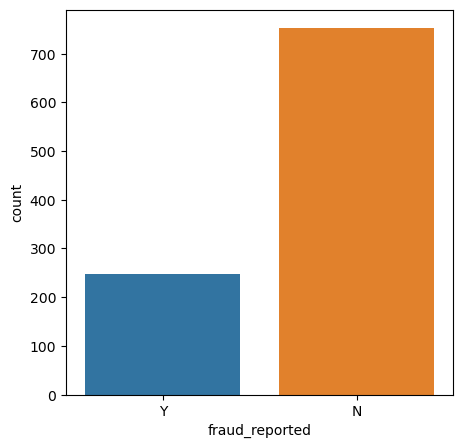

In [88]:
plt.figure(figsize = (5,5))
sns.countplot(x = 'fraud_reported', data = df)
plt.show()

In [89]:
# We will use oversampling method to balance the dataset later on!

In [90]:
categorical_col = df.select_dtypes(include = ['object']).columns

In [91]:
categorical_col

Index(['policy_bind_date', 'policy_state', 'policy_csl', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'incident_date', 'incident_type',
       'collision_type', 'incident_severity', 'authorities_contacted',
       'incident_state', 'incident_city', 'property_damage',
       'police_report_available', 'auto_make', 'auto_model', 'fraud_reported'],
      dtype='object')

In [94]:
num_cat_col = ['policy_deductable', 'bodily_injuries', 'witnesses', 'number_of_vehicles_involved', 'umbrella_limit', 'auto_year', 'incident_hour_of_the_day',  'age']

In [95]:
num_cat_col

['policy_deductable',
 'bodily_injuries',
 'witnesses',
 'number_of_vehicles_involved',
 'umbrella_limit',
 'auto_year',
 'incident_hour_of_the_day',
 'age']

In [96]:
numerical_col = [col for col in df.select_dtypes(include = ['int64','float64']).columns.to_list() if col not in num_cat_col]

In [97]:
numerical_col

['months_as_customer',
 'policy_annual_premium',
 'capital-gains',
 'capital-loss',
 'total_claim_amount',
 'injury_claim',
 'property_claim',
 'vehicle_claim']

In [139]:
# UNIVARIATE ANALYSIS

In [98]:
for col in categorical_col:
    print(f'Value count for {col} is')
    print(df[col].value_counts())
    print('*'*50)

Value count for policy_bind_date is
policy_bind_date
01-01-2006    3
28-04-1992    3
05-08-1992    3
14-12-1991    2
09-08-2004    2
             ..
03-06-2014    1
12-12-1998    1
18-02-1999    1
30-10-1997    1
11-11-1996    1
Name: count, Length: 951, dtype: int64
**************************************************
Value count for policy_state is
policy_state
OH    352
IL    338
IN    310
Name: count, dtype: int64
**************************************************
Value count for policy_csl is
policy_csl
250/500     351
100/300     349
500/1000    300
Name: count, dtype: int64
**************************************************
Value count for insured_sex is
insured_sex
FEMALE    537
MALE      463
Name: count, dtype: int64
**************************************************
Value count for insured_education_level is
insured_education_level
JD             161
High School    160
Associate      145
MD             144
Masters        143
PhD            125
College        122
Name: count, dt

In [99]:
# These are the unique values count in the categorical columns

In [100]:
# The policy_bind_date and incident_date columns should be transformed to date

In [103]:
# These are the unique values count in the numerical columns  

In [101]:
for col in numerical_col:
    print(f'Value count for {col} is')
    print(df[col].value_counts())
    print('*'*50)

Value count for months_as_customer is
months_as_customer
194    8
128    7
254    7
140    7
210    7
      ..
390    1
411    1
453    1
448    1
17     1
Name: count, Length: 391, dtype: int64
**************************************************
Value count for policy_annual_premium is
policy_annual_premium
1558.29    2
1215.36    2
1362.87    2
1073.83    2
1389.13    2
          ..
1085.03    1
1437.33    1
988.29     1
1238.89    1
766.19     1
Name: count, Length: 991, dtype: int64
**************************************************
Value count for capital-gains is
capital-gains
0        508
46300      5
51500      4
68500      4
55600      3
        ... 
36700      1
54900      1
69200      1
48800      1
50300      1
Name: count, Length: 338, dtype: int64
**************************************************
Value count for capital-loss is
capital-loss
 0        475
-31700      5
-53700      5
-50300      5
-45300      4
         ... 
-12100      1
-17000      1
-72900      1
-19700 

In [104]:
# These are the unique values count in the numerical columns that reprent a category

In [105]:
# Capital Gains and Capital loss features have large no of zeroes in it

In [102]:
for col in num_cat_col:
    print(f'Value count for {col} is')
    print(df[col].value_counts())
    print('*'*50)

Value count for policy_deductable is
policy_deductable
1000    351
500     342
2000    307
Name: count, dtype: int64
**************************************************
Value count for bodily_injuries is
bodily_injuries
0    340
2    332
1    328
Name: count, dtype: int64
**************************************************
Value count for witnesses is
witnesses
1    258
2    250
0    249
3    243
Name: count, dtype: int64
**************************************************
Value count for number_of_vehicles_involved is
number_of_vehicles_involved
1    581
3    358
4     31
2     30
Name: count, dtype: int64
**************************************************
Value count for umbrella_limit is
umbrella_limit
 0           798
 6000000      57
 5000000      46
 4000000      39
 7000000      29
 3000000      12
 8000000       8
 9000000       5
 2000000       3
 10000000      2
-1000000       1
Name: count, dtype: int64
**************************************************
Value count for auto_yea

In [106]:
# Summary Staistics of numerical and non-numerical values in the dataset

In [107]:
stats = df.describe()

In [108]:
stats

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
count,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,1136.000000,1256.406150,1.101000e+06,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,2005.103000
std,115.113174,9.140287,611.864673,244.167395,2.297407e+06,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,6.015861
min,0.000000,19.000000,500.000000,433.330000,-1.000000e+06,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1995.000000
25%,115.750000,32.000000,500.000000,1089.607500,0.000000e+00,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,2000.000000
50%,199.500000,38.000000,1000.000000,1257.200000,0.000000e+00,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,2005.000000
75%,276.250000,44.000000,2000.000000,1415.695000,0.000000e+00,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,2010.000000
max,479.000000,64.000000,2000.000000,2047.590000,1.000000e+07,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,2015.000000


In [109]:
# The summary of the dataset presents negative values in umberalla_limit and capital-loss columns  

In [110]:
# In all columns we can see that there is no missing values except for the '?' values registered in collision_type ,property_damage and police_report_available 

In [111]:
df.describe(exclude = [np.number])

,policy_bind_date,policy_state,policy_csl,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,property_damage,police_report_available,auto_make,auto_model,fraud_reported
count,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000
unique,951,3,3,2,7,14,20,6,60,4,4,4,4,7,7,3,3,14,39,2
top,01-01-2006,OH,250/500,FEMALE,JD,machine-op-inspct,reading,own-child,02-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Springfield,?,?,Saab,RAM,N
freq,3,352,351,537,161,93,64,183,28,419,292,354,383,262,157,360,343,80,43,753


In [112]:
df[df.duplicated()].shape

(0, 36)

In [113]:
# THere are no duplicate values in the dataset

In [114]:
# Data Visualisation

In [118]:
# Categorical columns

In [115]:
date_col = ['policy_bind_date','incident_date']

for col in date_col:
    df[col] = pd.to_datetime(df[col])

In [117]:
print(df[date_col].dtypes)

policy_bind_date    datetime64[ns]
incident_date       datetime64[ns]
dtype: object


In [119]:
categorical_col

Index(['policy_bind_date', 'policy_state', 'policy_csl', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'incident_date', 'incident_type',
       'collision_type', 'incident_severity', 'authorities_contacted',
       'incident_state', 'incident_city', 'property_damage',
       'police_report_available', 'auto_make', 'auto_model', 'fraud_reported'],
      dtype='object')

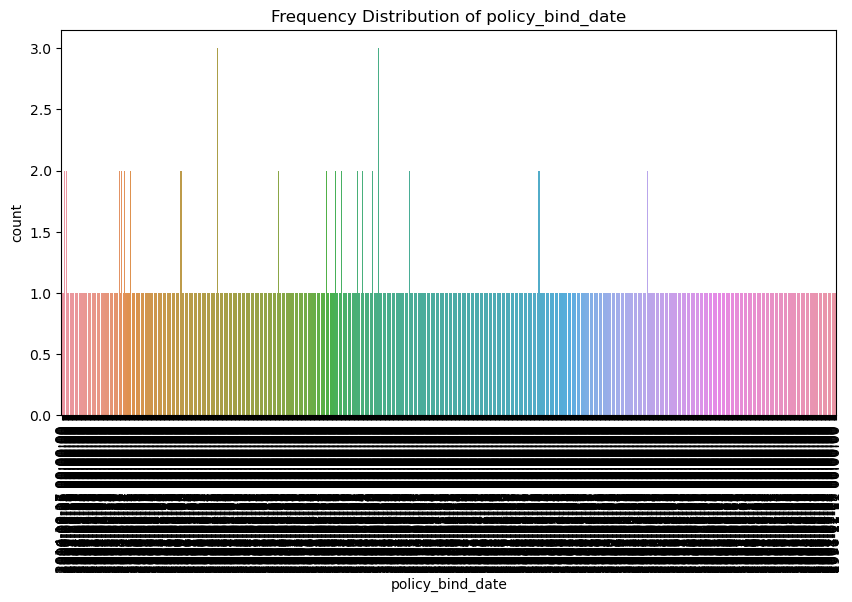

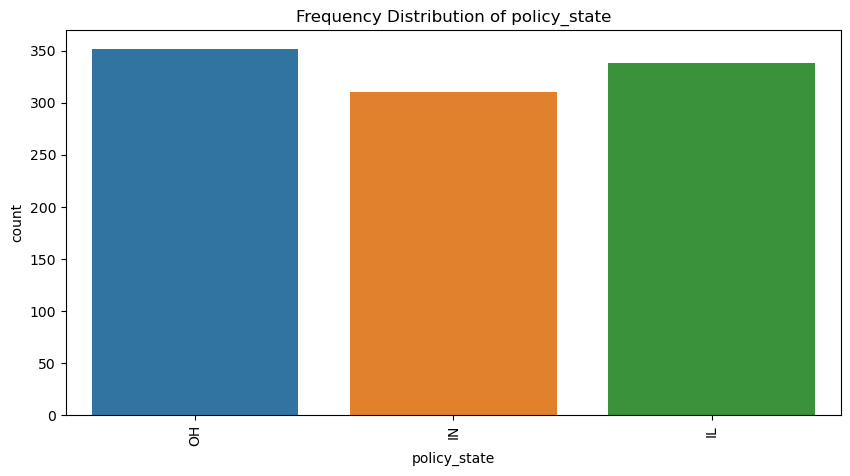

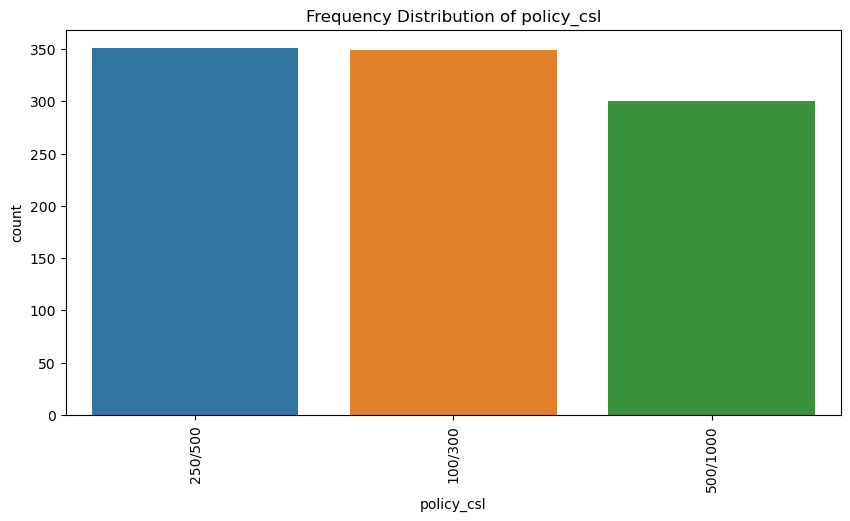

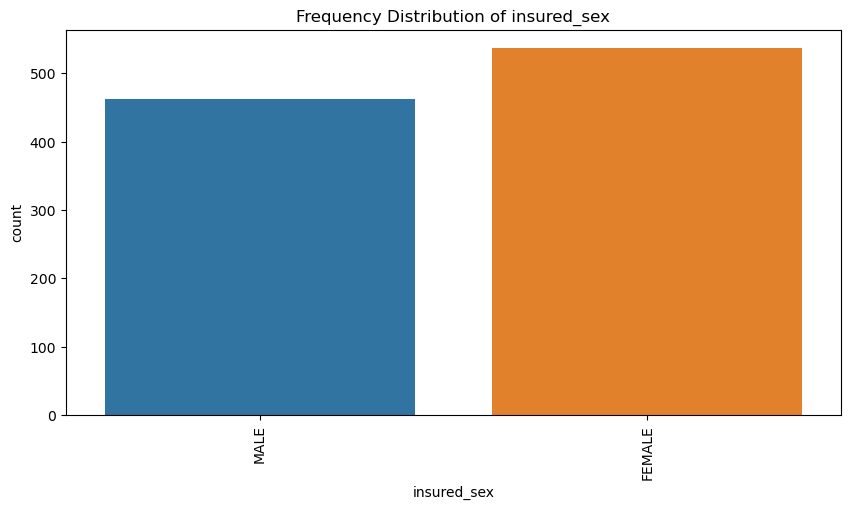

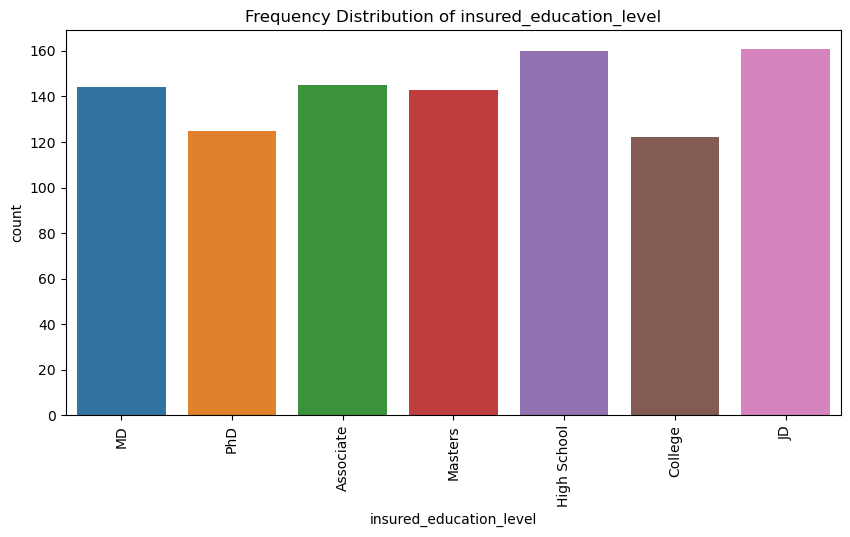

...

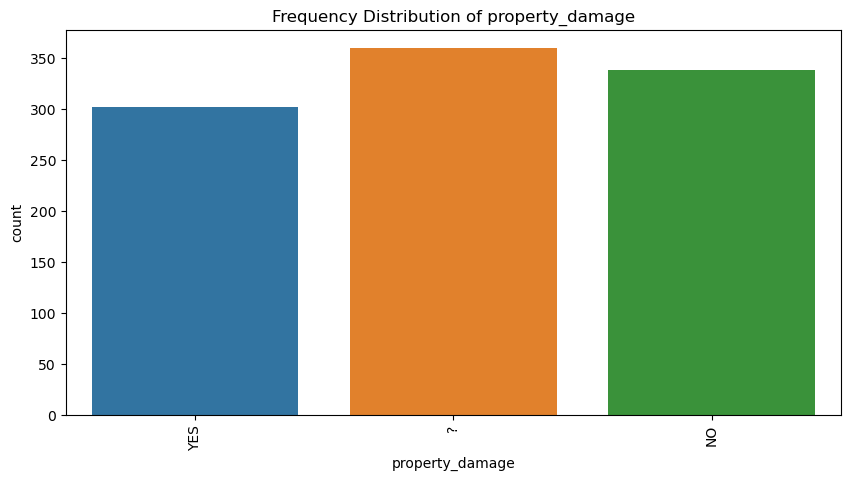

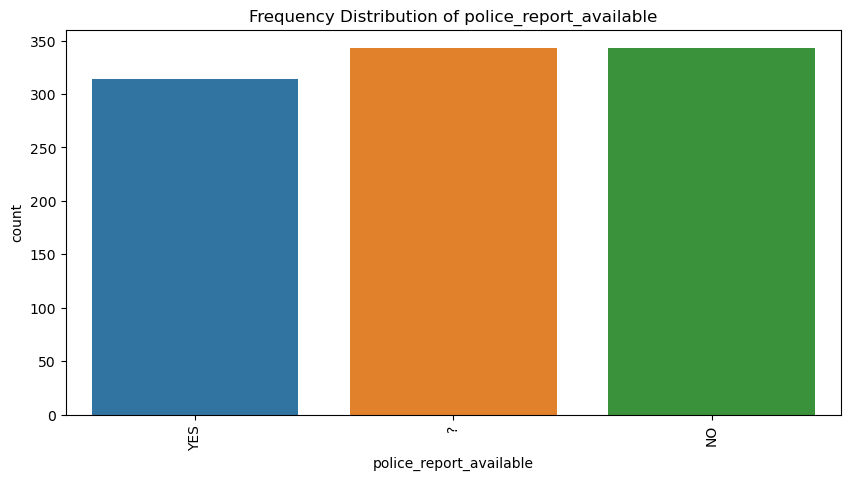

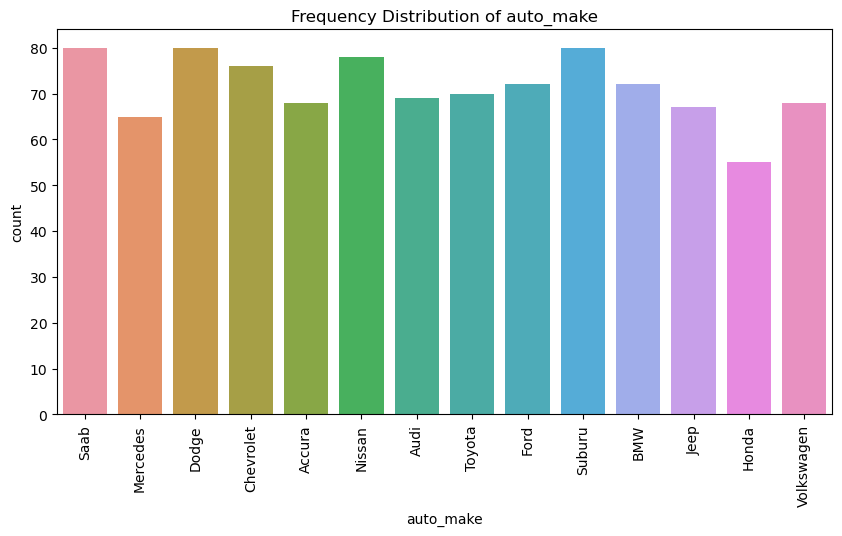

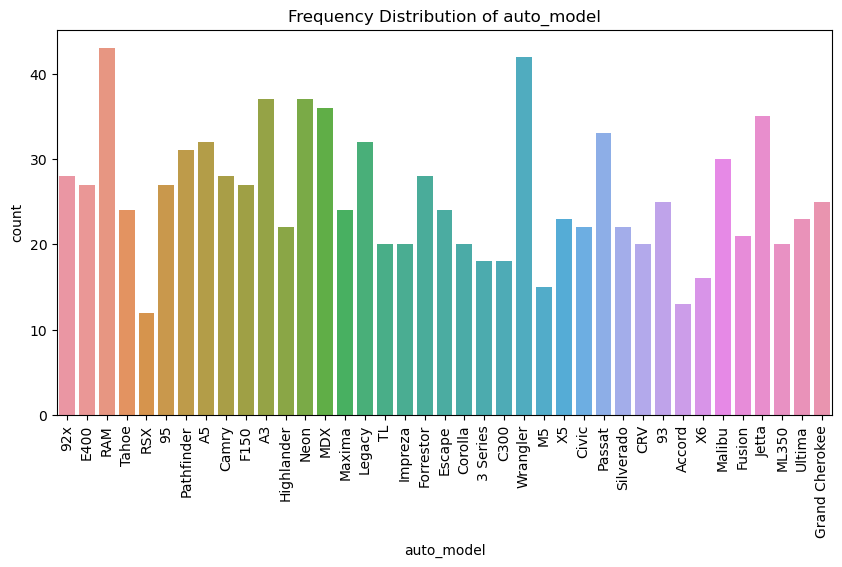

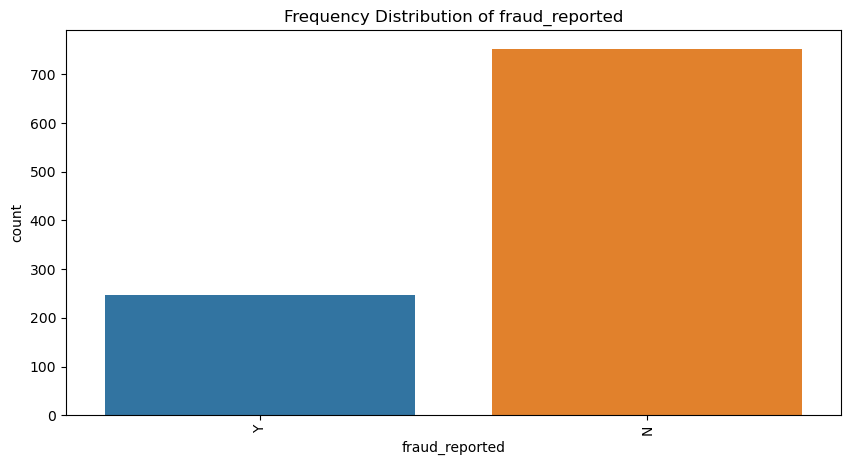

In [122]:
for col in categorical_col:
    plt.figure(figsize = (10,5))
    sns.countplot(x = df[col],data = df)
    plt.xticks(rotation = 90)
    plt.title(f'Frequency Distribution of {col}')
    plt.show()

In [123]:
# Frequency distribution of fraud_reported

In [124]:
df['fraud_reported'].value_counts()

fraud_reported
N    753
Y    247
Name: count, dtype: int64

In [125]:
# 753 Non-fraudulent claims and 247 fraudulent claims reported and Data is imbalanced

In [126]:
# Frequency distribution of insured_sex

In [127]:
df['insured_sex'].value_counts()

insured_sex
FEMALE    537
MALE      463
Name: count, dtype: int64

In [128]:
# 537 belongs to females and 463 belongs to males

In [129]:
# Frequency distribution of insured_occupation

In [130]:
df['insured_occupation'].value_counts()

insured_occupation
machine-op-inspct    93
prof-specialty       85
tech-support         78
sales                76
exec-managerial      76
craft-repair         74
transport-moving     72
other-service        71
priv-house-serv      71
armed-forces         69
adm-clerical         65
protective-serv      63
handlers-cleaners    54
farming-fishing      53
Name: count, dtype: int64

In [131]:
# Maximum claim is from machine-op-inspct and prof-specialty

In [132]:
# Frequency of police_report_available

In [133]:
df['police_report_available'].value_counts()

police_report_available
?      343
NO     343
YES    314
Name: count, dtype: int64

In [134]:
# 343 are reported as missing values

In [135]:
df['collision_type'].value_counts()

collision_type
Rear Collision     292
Side Collision     276
Front Collision    254
?                  178
Name: count, dtype: int64

In [136]:
# Maximum claims are from Rear Collision and 178 are supposed to be missing values 

In [137]:
# Numerical columns analyzed as categories

In [138]:
num_cat_col

['policy_deductable',
 'bodily_injuries',
 'witnesses',
 'number_of_vehicles_involved',
 'umbrella_limit',
 'auto_year',
 'incident_hour_of_the_day',
 'age']

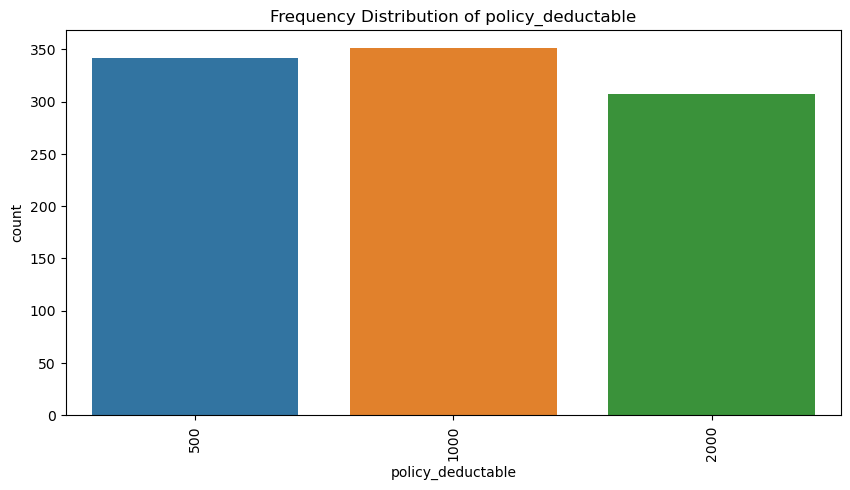

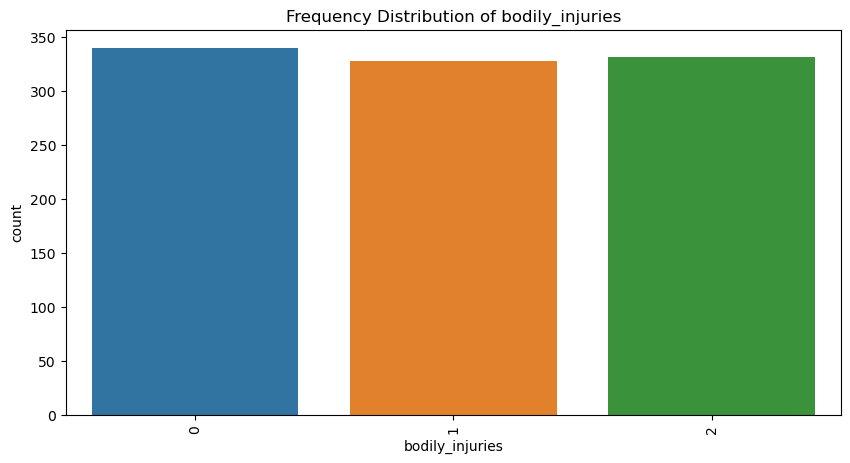

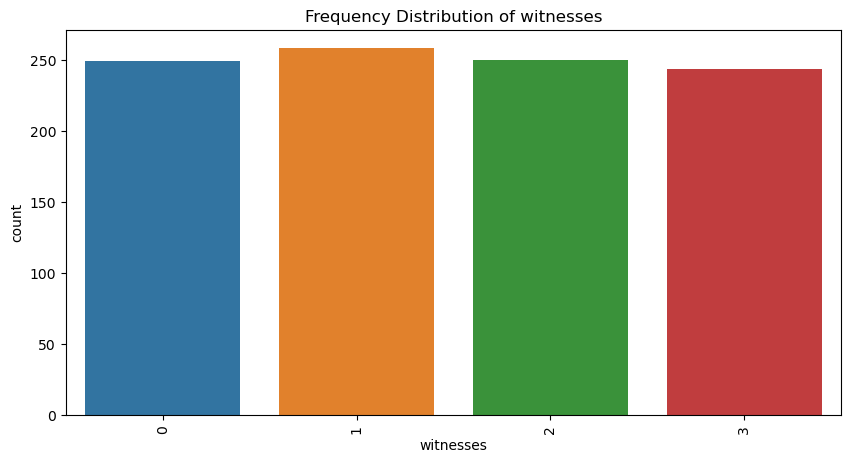

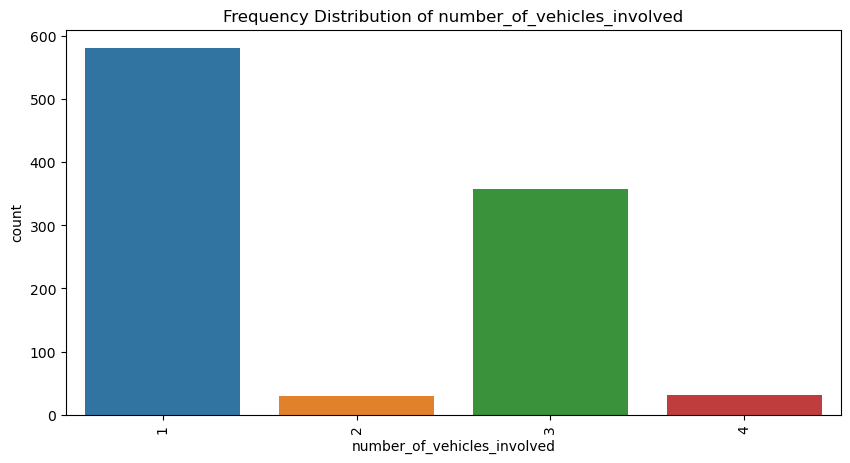

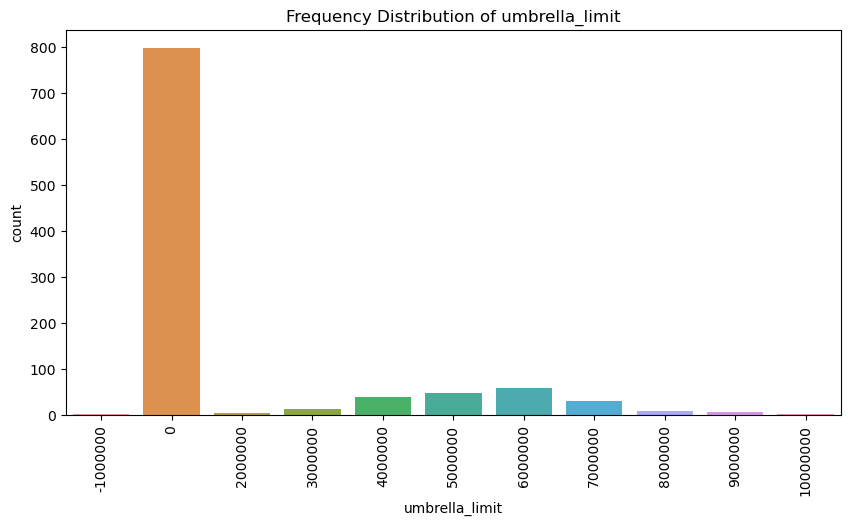

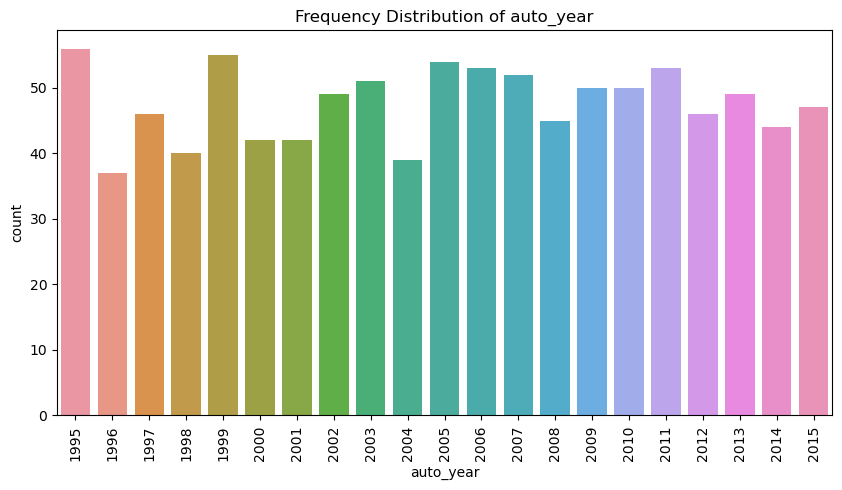

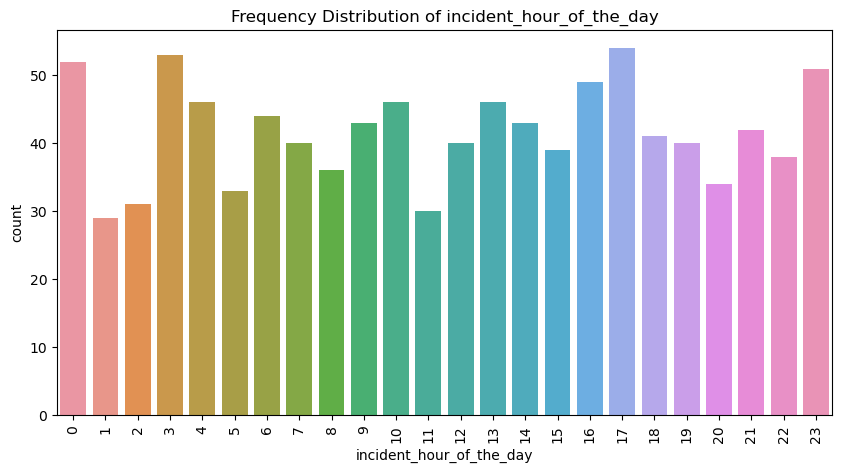

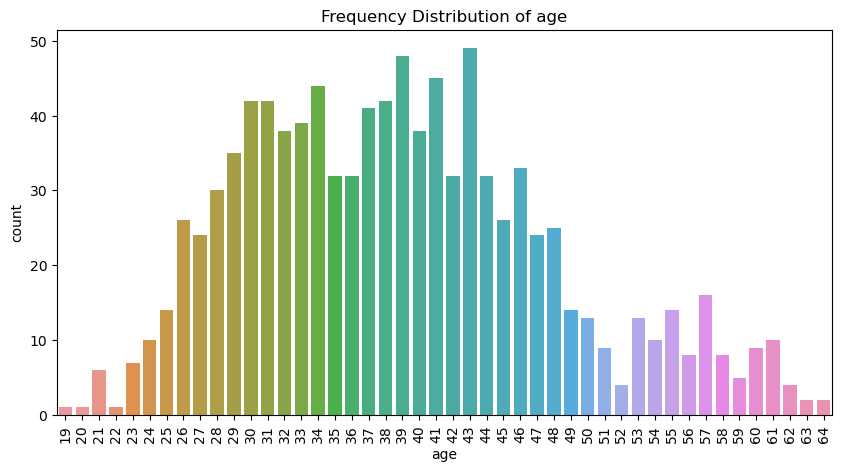

In [140]:
for col in num_cat_col:
    plt.figure(figsize = (10,5))
    sns.countplot(x = df[col],data = df)
    plt.xticks(rotation = 90)
    plt.title(f'Frequency Distribution of {col}')
    plt.show()

In [141]:
# NUMERICAL COLUMNS

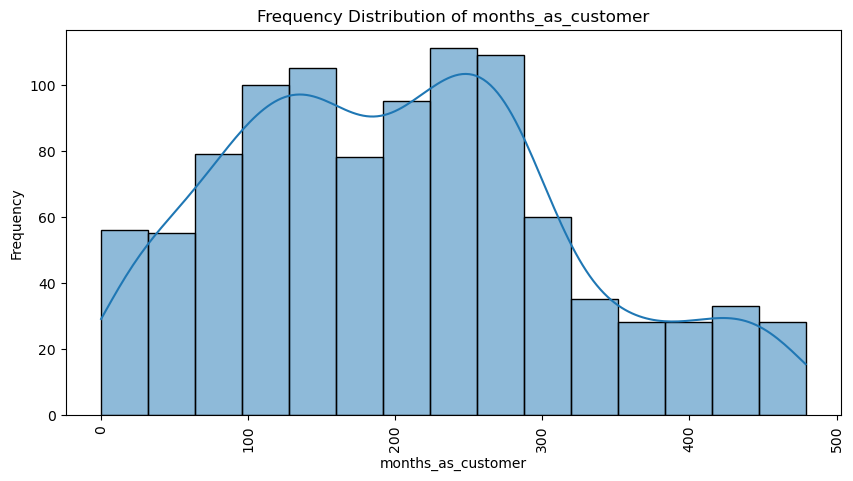

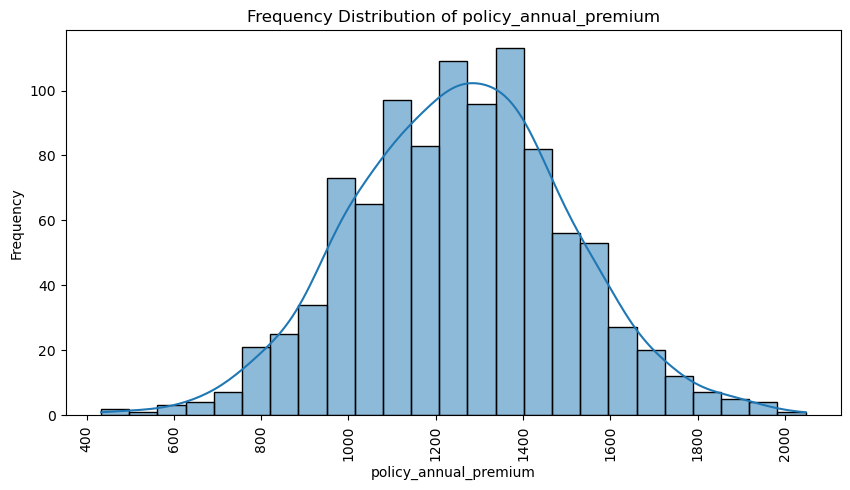

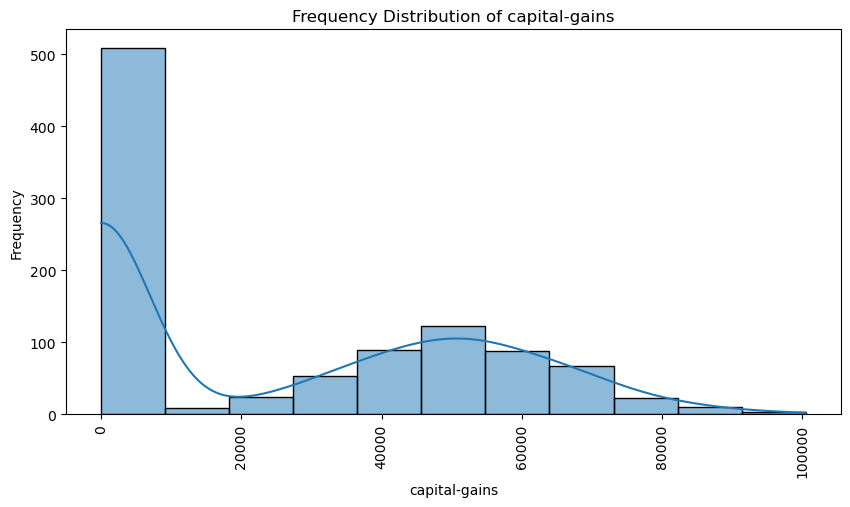

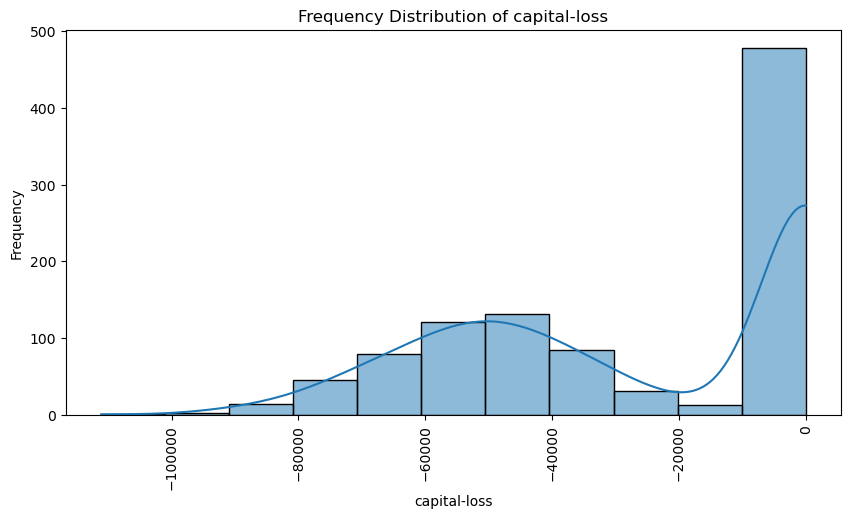

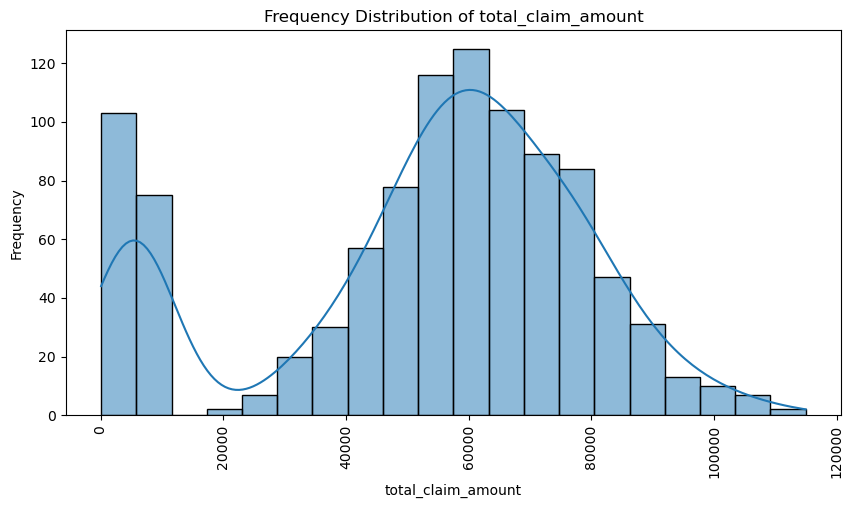

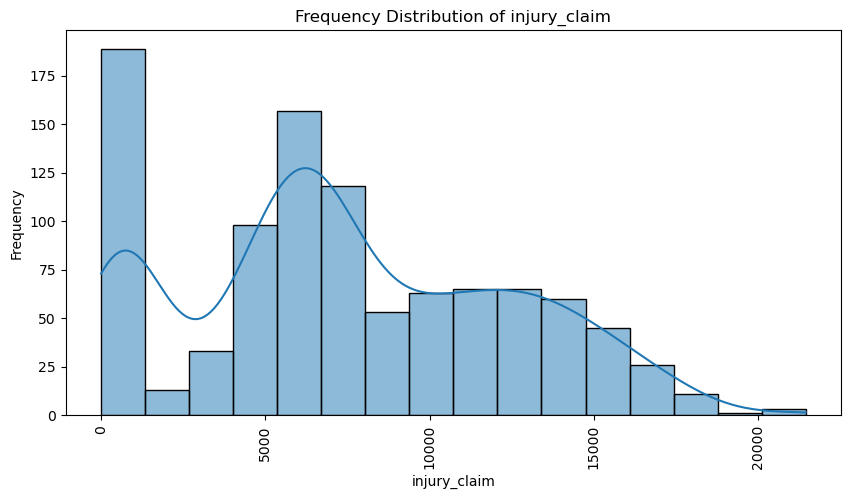

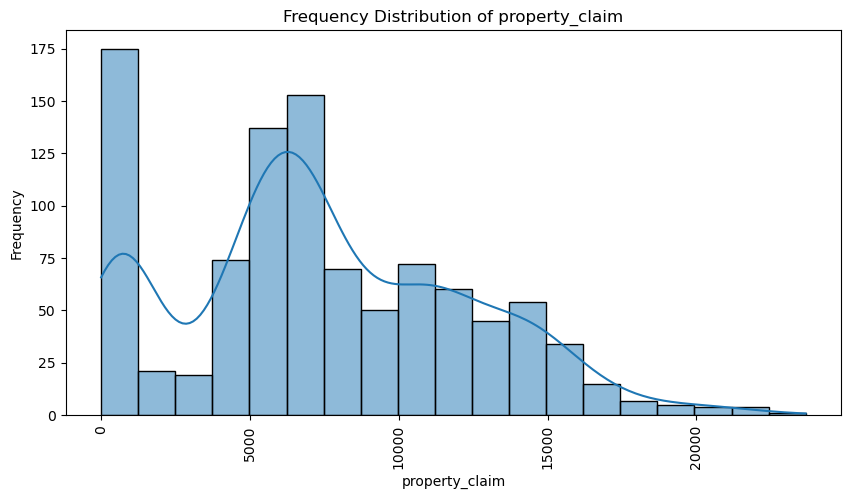

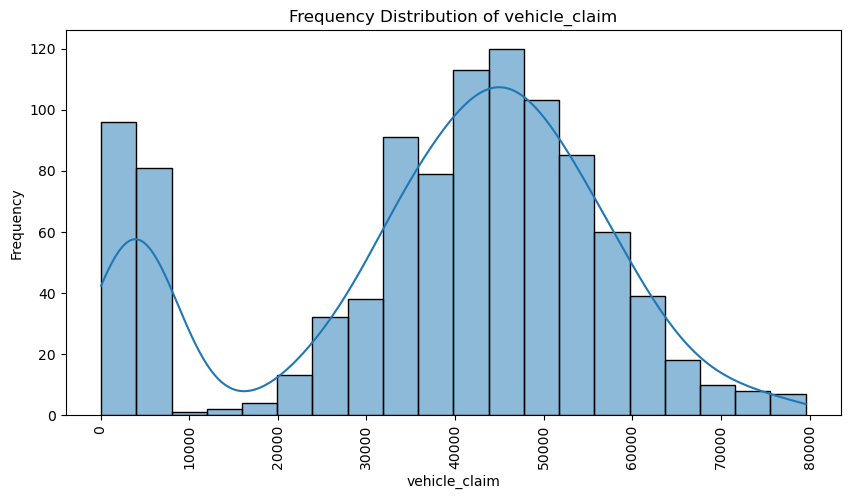

In [142]:
for col in numerical_col:
    plt.figure(figsize = (10,5))
    sns.histplot(x = df[col],kde = True)
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.xticks(rotation = 90)
    plt.title(f'Frequency Distribution of {col}')
    plt.show()

In [143]:
# Skewness in the distribution of months_as_customer involved to the right 

In [144]:
# The distribution of policy_annual_premium is almost normal

In [145]:
# The capital_gains is distributed to the right due to large number of zeroes 

In [146]:
# The capital_loss is distributed to the left due to large number of zeroes and negative values in the datasets

In [147]:
# The distribution of total_claim_amount involved is skewed to the left due to large number of zeroes

In [148]:
# The distribution of injury_claim is skewed to the right

In [149]:
# The distribution of property_claim is skewed to the right due to large number of zeroes

In [150]:
# The distribution of vehicle_claim is left-skewed to the right due to large number of zeroes

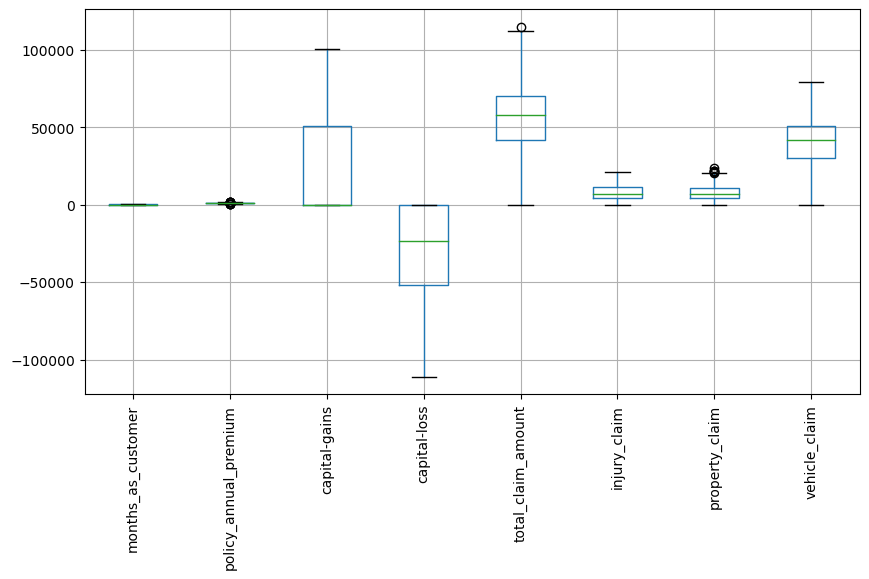

In [152]:
# Draw a boxplot for numerical_col variables
plt.figure(figsize = (10,5))
df.boxplot(column = numerical_col)
plt.xticks(rotation = 90)
plt.show()

In [153]:
# The policy_annual_premium, total_claim_amount, and property_claim columns presents outliers. 
# The data presents the data in different scales

In [154]:
# BIVARIATE ANALYSIS

In [158]:
# Boxplot analysis of numerical_col vs fraud_reported and finding outliers

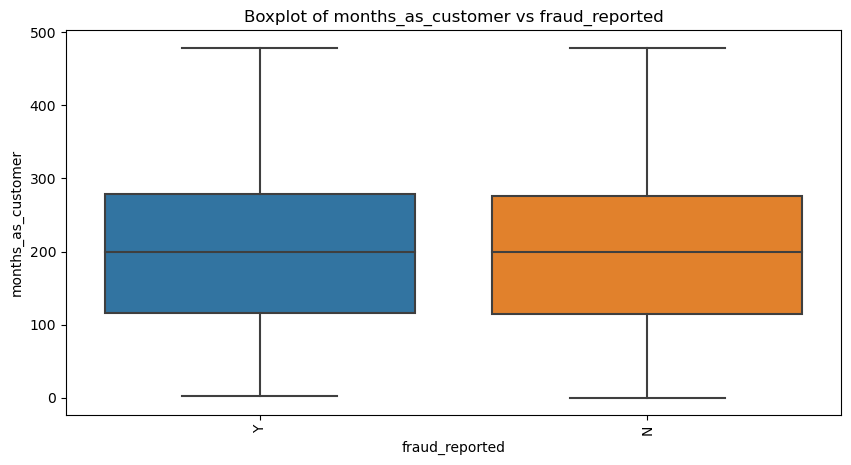

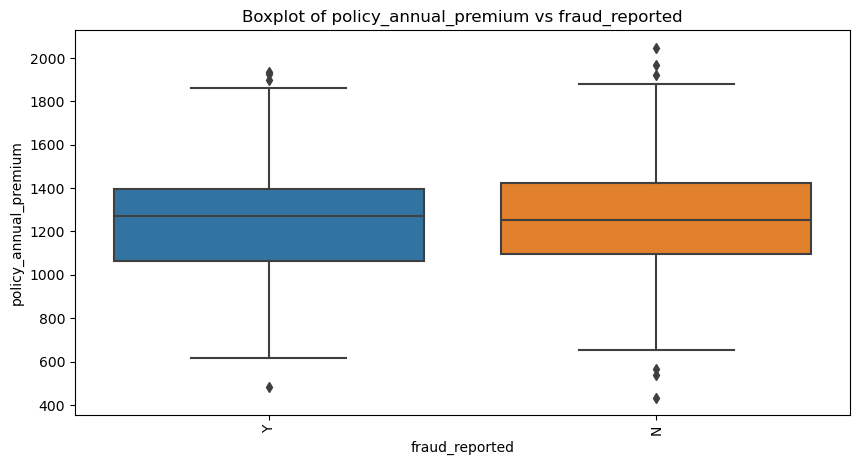

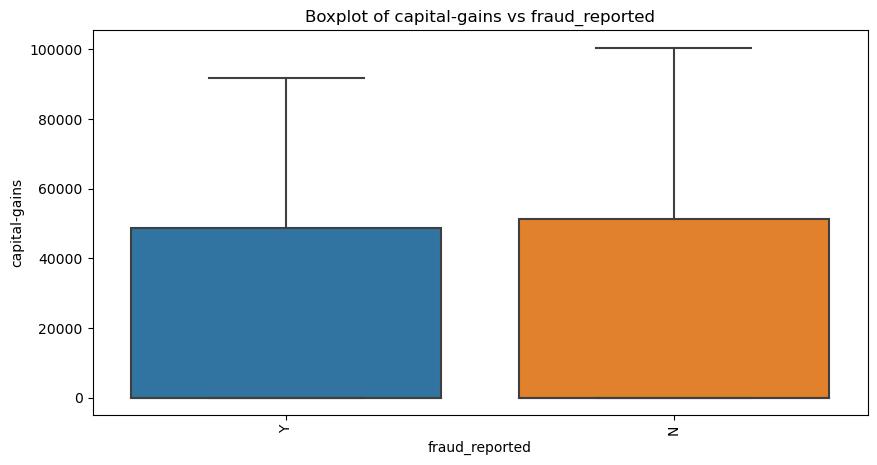

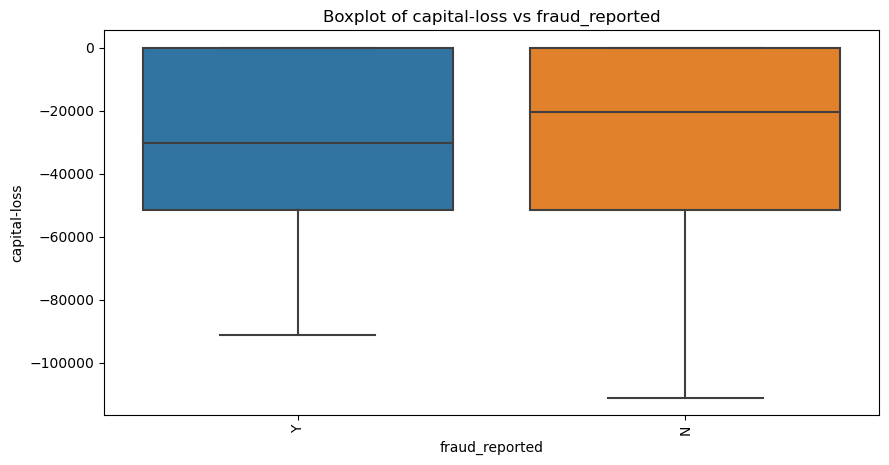

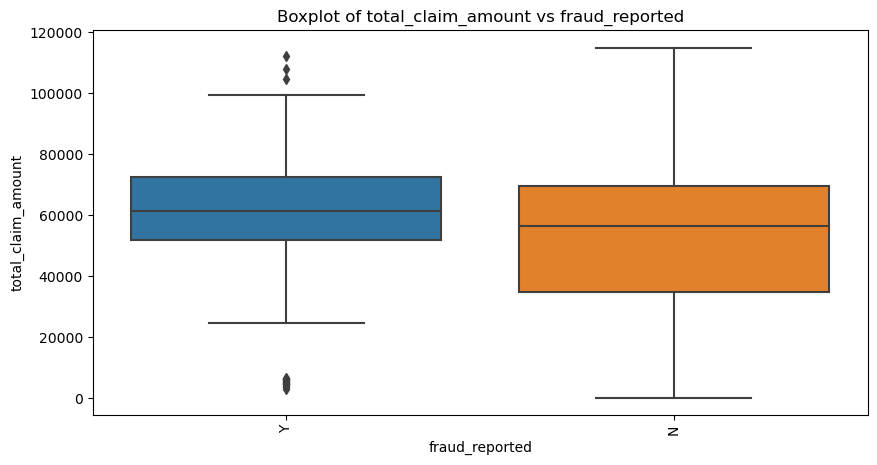

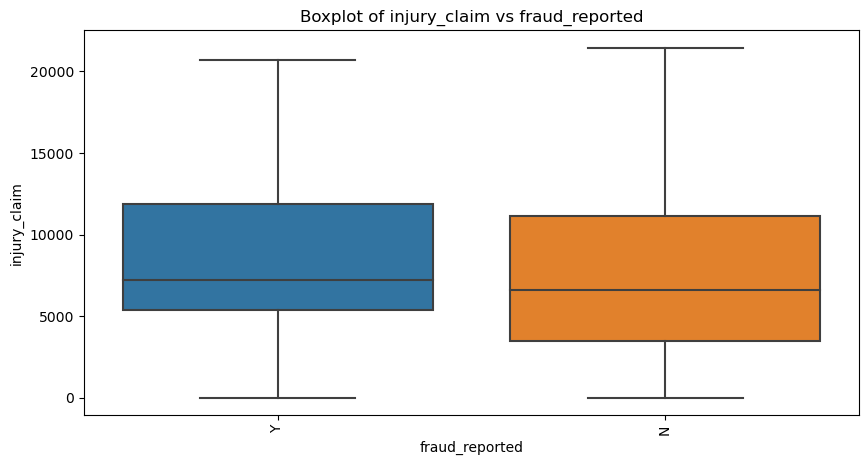

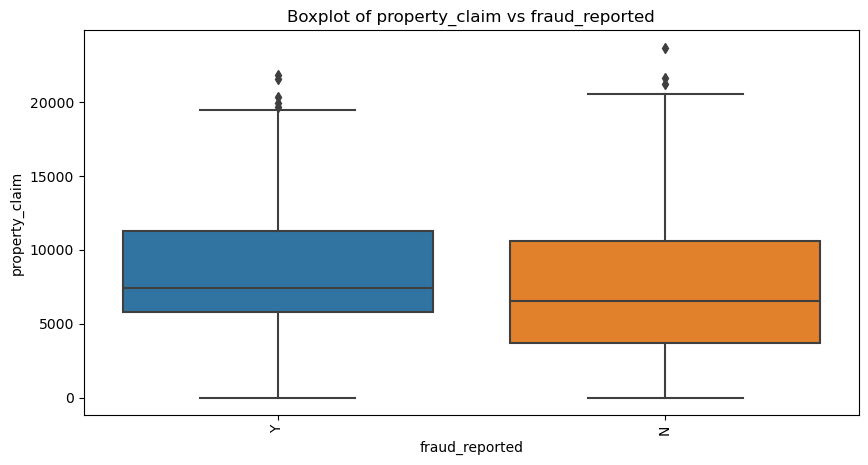

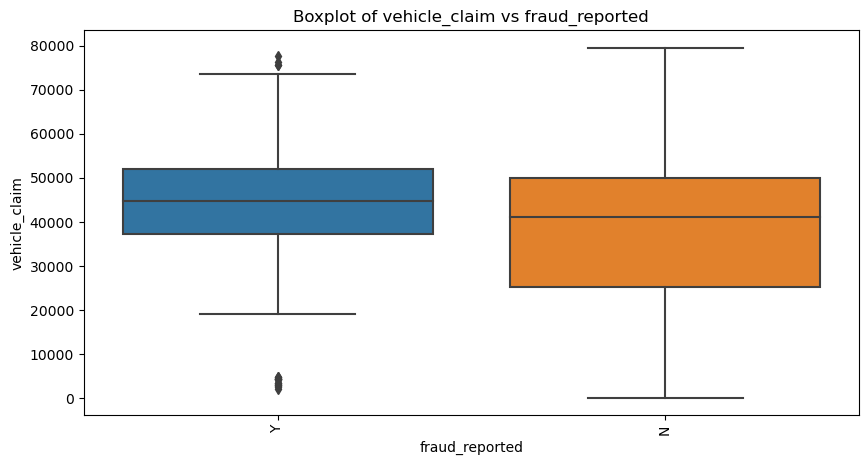

In [157]:
for col in numerical_col:
    plt.figure(figsize = (10,5))
    sns.boxplot(x = df['fraud_reported'],y = df[col], data = df)
    plt.xlabel('fraud_reported')
    plt.ylabel(col)
    plt.xticks(rotation = 90)
    plt.title(f'Boxplot of {col} vs fraud_reported')
    plt.show()

In [159]:
# Relation between target variable and categorical variables

In [161]:
categorical_col

Index(['policy_bind_date', 'policy_state', 'policy_csl', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'incident_date', 'incident_type',
       'collision_type', 'incident_severity', 'authorities_contacted',
       'incident_state', 'incident_city', 'property_damage',
       'police_report_available', 'auto_make', 'auto_model', 'fraud_reported'],
      dtype='object')

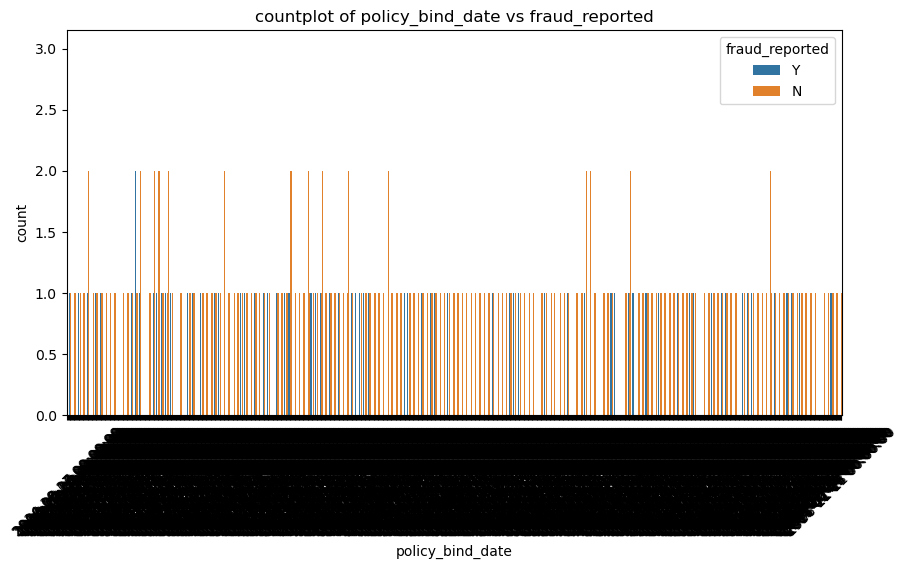

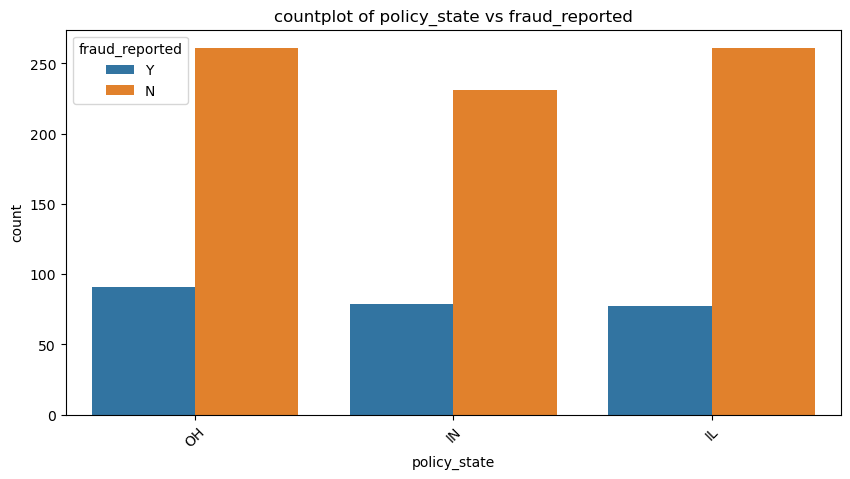

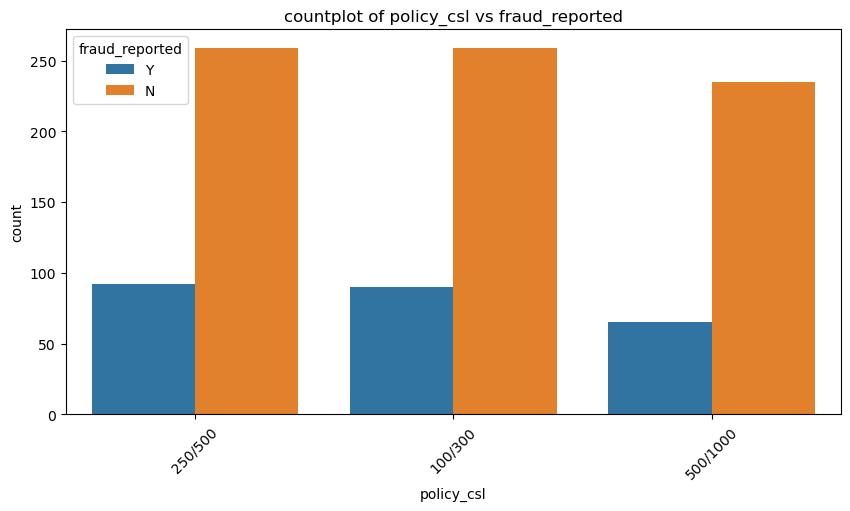

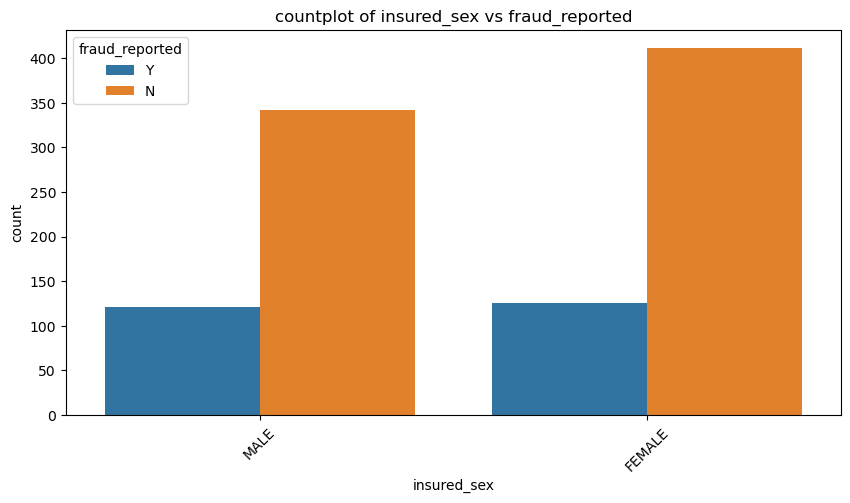

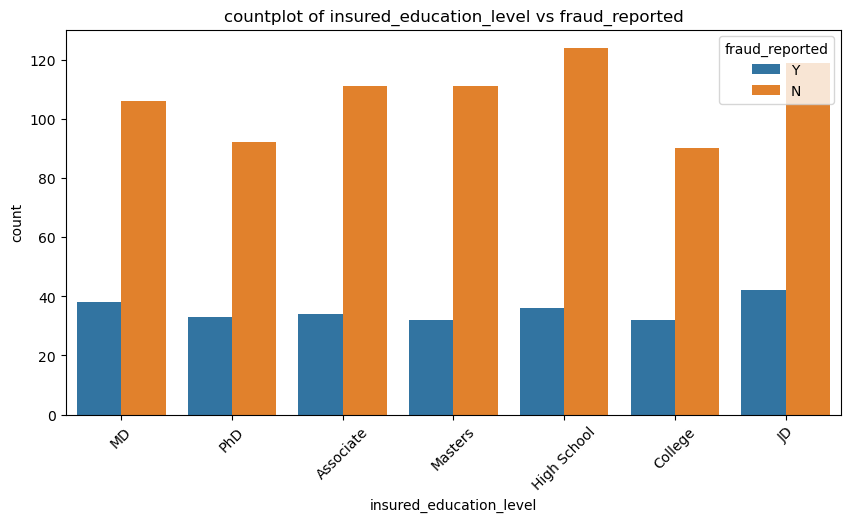

...

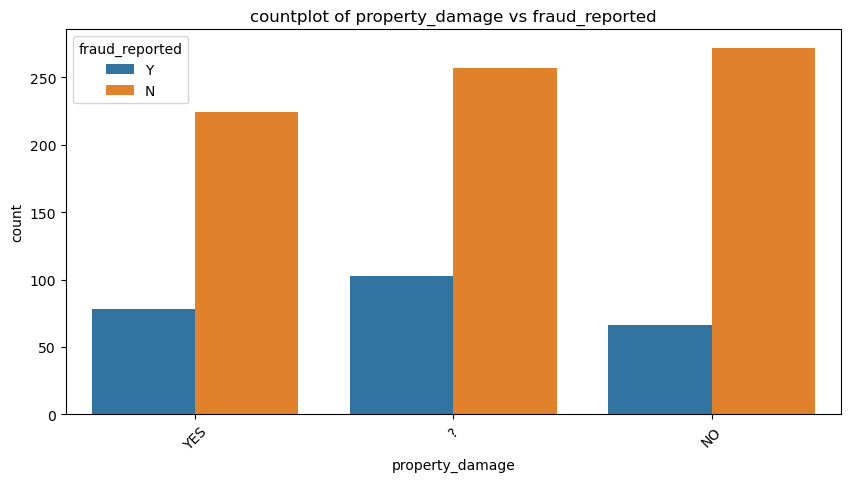

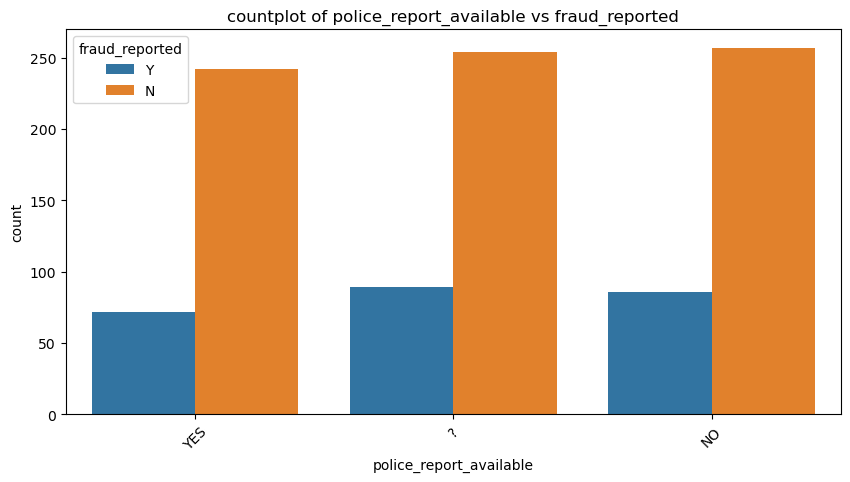

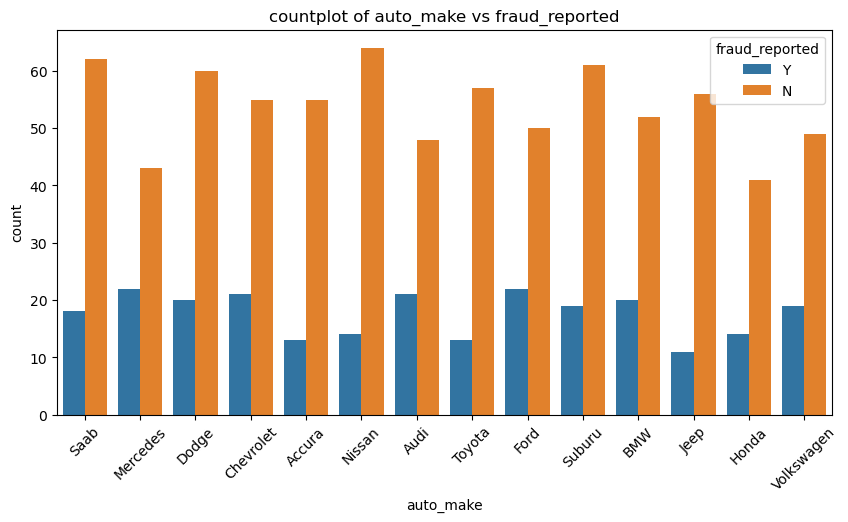

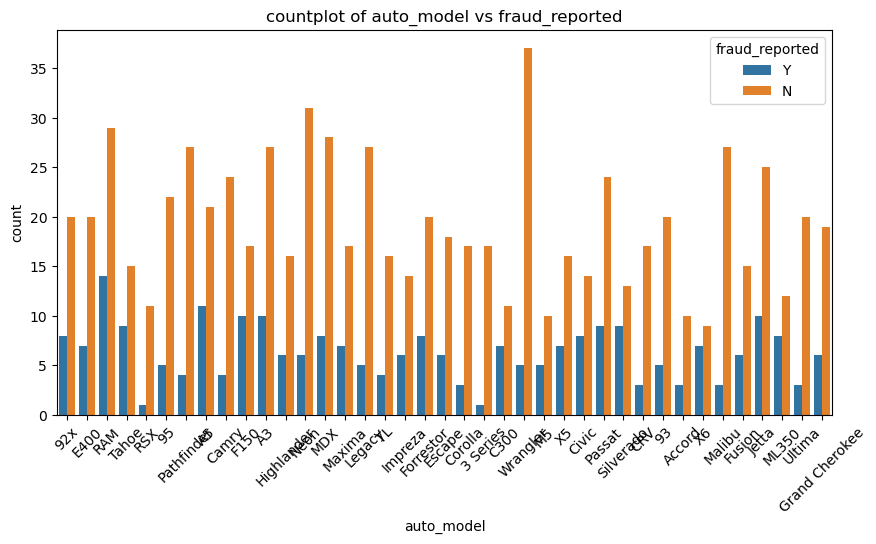

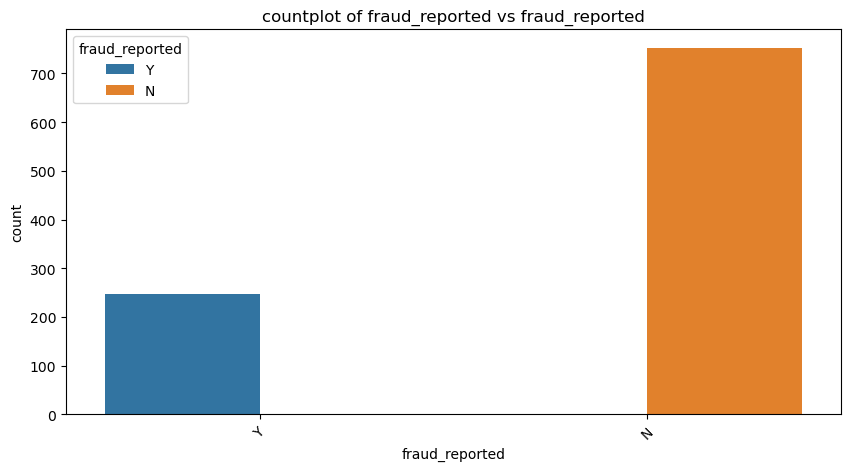

In [164]:
for col in categorical_col:
    plt.figure(figsize = (10,5))
    sns.countplot(x = col, hue = df['fraud_reported'], data = df)
    plt.xlabel(col)
    plt.ylabel('count')
    plt.xticks(rotation = 45)
    plt.title(f'countplot of {col} vs fraud_reported')
    plt.show()

In [165]:
# Preprocessing incident_date column

In [166]:
# We will create new columns from incident_date column and then drop it

In [167]:
df['year'] = df['incident_date'].dt.year
df['month'] = df['incident_date'].dt.month
df['day'] = df['incident_date'].dt.day
df.drop('incident_date',axis = 1,inplace = True)

In [168]:
# Multivariate analysis

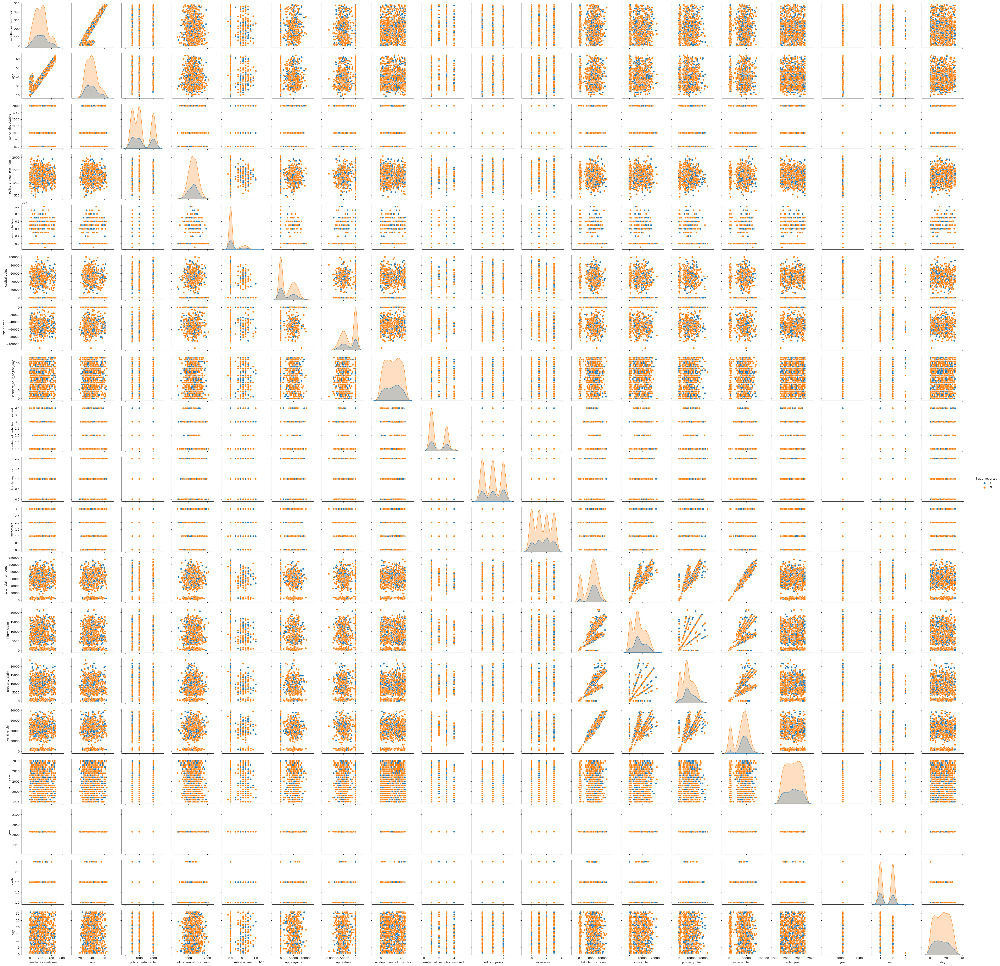

In [169]:
sns.pairplot(df, hue = 'fraud_reported')
plt.show()

In [170]:
# Encoding the categorical variable fraud_reported

In [171]:
df['fraud_reported'].unique()

array(['Y', 'N'], dtype=object)

In [172]:
df['fraud_reported'] = df['fraud_reported'].map({'Y':1,'N':0})
df

,months_as_customer,age,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,...,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,year,month,day
0,328,48,2014-10-17,OH,250/500,1000,1406.91,0,MALE,MD,...,6510,13020,52080,Saab,92x,2004,1,2015,1,25
1,228,42,2006-06-27,IN,250/500,2000,1197.22,5000000,MALE,MD,...,780,780,3510,Mercedes,E400,2007,1,2015,1,21
2,134,29,2000-09-06,OH,100/300,2000,1413.14,5000000,FEMALE,PhD,...,7700,3850,23100,Dodge,RAM,2007,0,2015,2,22
3,256,41,1990-05-25,IL,250/500,2000,1415.74,6000000,FEMALE,PhD,...,6340,6340,50720,Chevrolet,Tahoe,2014,1,2015,1,10
4,228,44,2014-06-06,IL,500/1000,1000,1583.91,6000000,MALE,Associate,...,1300,650,4550,Accura,RSX,2009,0,2015,2,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,1991-07-16,OH,500/1000,1000,1310.80,0,FEMALE,Masters,...,17440,8720,61040,Honda,Accord,2006,0,2015,2,22
996,285,41,2014-01-05,IL,100/300,1000,1436.79,0,FEMALE,PhD,...,18080,18080,72320,Volkswagen,Passat,2015,0,2015,1,24
997,130,34,2003-02-17,OH,250/500,500,1383.49,3000000,FEMALE,Masters,...,7500,7500,52500,Suburu,Impreza,1996,0,2015,1,23
998,458,62,2011-11-18,IL,500/1000,2000,1356.92,5000000,MALE,Associate,...,5220,5220,36540,Audi,A5,1998,0,2015,2,26


In [173]:
df.year.unique()

array([2015])

In [174]:
# The year column has only one value i.e. 2015
# So we can drop the year column
df.drop('year',axis = 1,inplace = True)

In [176]:
# Drop the columns which are not required
df.drop(['policy_bind_date'],axis = 1,inplace = True)
df

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,month,day
0,328,48,OH,250/500,1000,1406.91,0,MALE,MD,craft-repair,...,71610,6510,13020,52080,Saab,92x,2004,1,1,25
1,228,42,IN,250/500,2000,1197.22,5000000,MALE,MD,machine-op-inspct,...,5070,780,780,3510,Mercedes,E400,2007,1,1,21
2,134,29,OH,100/300,2000,1413.14,5000000,FEMALE,PhD,sales,...,34650,7700,3850,23100,Dodge,RAM,2007,0,2,22
3,256,41,IL,250/500,2000,1415.74,6000000,FEMALE,PhD,armed-forces,...,63400,6340,6340,50720,Chevrolet,Tahoe,2014,1,1,10
4,228,44,IL,500/1000,1000,1583.91,6000000,MALE,Associate,sales,...,6500,1300,650,4550,Accura,RSX,2009,0,2,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,OH,500/1000,1000,1310.80,0,FEMALE,Masters,craft-repair,...,87200,17440,8720,61040,Honda,Accord,2006,0,2,22
996,285,41,IL,100/300,1000,1436.79,0,FEMALE,PhD,prof-specialty,...,108480,18080,18080,72320,Volkswagen,Passat,2015,0,1,24
997,130,34,OH,250/500,500,1383.49,3000000,FEMALE,Masters,armed-forces,...,67500,7500,7500,52500,Suburu,Impreza,1996,0,1,23
998,458,62,IL,500/1000,2000,1356.92,5000000,MALE,Associate,handlers-cleaners,...,46980,5220,5220,36540,Audi,A5,1998,0,2,26


In [178]:
numeric_df = df.select_dtypes(['int64','float64'])
cor = numeric_df.corr()
cor

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,fraud_reported
months_as_customer,1.000000,0.922098,0.026807,0.005018,0.015498,0.006399,0.020209,0.070639,0.014736,-0.010162,0.058383,0.062108,0.065329,0.034940,0.061013,-0.000292,0.020544
age,0.922098,1.000000,0.029188,0.014404,0.018126,-0.007075,0.007368,0.087161,0.022102,-0.015679,0.052359,0.069863,0.075522,0.060898,0.062588,0.001354,0.012143
policy_deductable,0.026807,0.029188,1.000000,-0.003245,0.010870,0.035212,-0.023544,0.060935,0.051214,-0.022765,0.066639,0.022839,0.039107,0.064792,0.005269,0.026105,0.014817
policy_annual_premium,0.005018,0.014404,-0.003245,1.000000,-0.006247,-0.013738,0.023547,-0.001578,-0.045991,0.026780,0.002332,0.009094,-0.017633,-0.011654,0.020246,-0.049226,-0.014480
umbrella_limit,0.015498,0.018126,0.010870,-0.006247,1.000000,-0.047268,-0.024056,-0.023257,-0.021270,0.022743,-0.006738,-0.040344,-0.045412,-0.023790,-0.038584,0.009893,0.058622
capital-gains,0.006399,-0.007075,0.035212,-0.013738,-0.047268,1.000000,-0.046904,-0.016406,0.061643,0.055829,-0.017651,0.015980,0.025934,-0.000779,0.015836,0.031398,-0.019173
capital-loss,0.020209,0.007368,-0.023544,0.023547,-0.024056,-0.046904,1.000000,-0.025054,-0.014895,-0.024418,-0.041330,-0.036060,-0.046060,-0.022863,-0.032665,-0.056615,-0.014863
incident_hour_of_the_day,0.070639,0.087161,0.060935,-0.001578,-0.023257,-0.016406,-0.025054,1.000000,0.120794,-0.034563,0.006527,0.217702,0.165768,0.179536,0.215626,0.021368,0.004316
number_of_vehicles_involved,0.014736,0.022102,0.051214,-0.045991,-0.021270,0.061643,-0.014895,0.120794,1.000000,0.014030,-0.014669,0.274278,0.224650,0.219084,0.269393,0.034554,0.051839
bodily_injuries,-0.010162,-0.015679,-0.022765,0.026780,0.022743,0.055829,-0.024418,-0.034563,0.014030,1.000000,-0.005606,0.047093,0.047319,0.039749,0.043449,-0.020527,0.033877


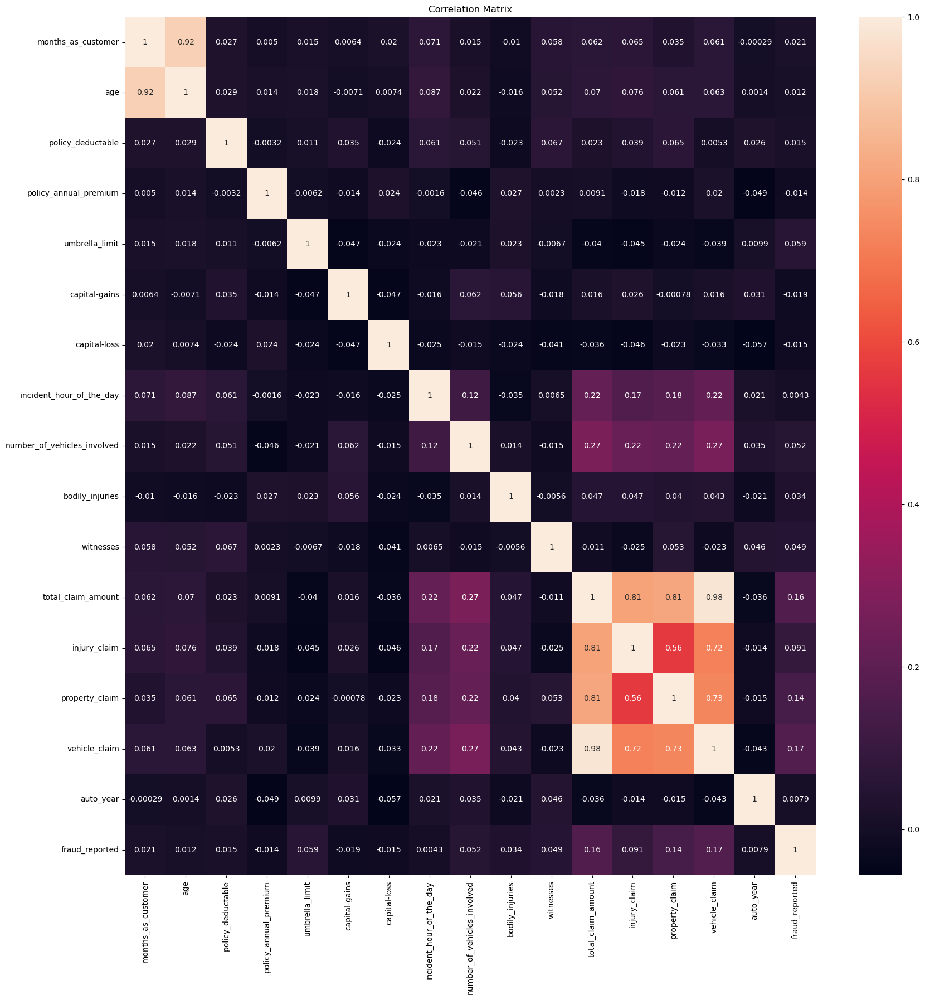

In [180]:
plt.figure(figsize=(20,20))
sns.heatmap(cor,annot=True)
plt.title("Correlation Matrix")
plt.show()

In [181]:
# The target variable shows low_correlation with total_claim_amount, vehicle_claim and property_claim

In [182]:
# Age exihibits a high correlation with months_as_customer 

In [183]:
# Total_claim_amount exihibits a high correlation with injury_claim, propert_claim and vehicle_claim

In [184]:
# Month demonstrate a high correlation with day

In [185]:
# Number_of_vehicles_involved moderately correlates with total_claim_amount

In [186]:
# Preprocessing data

In [187]:
# However During EDA we identified some values recorded as '?' as null values

In [188]:
# Replace all occurences of '?' with np.NaN
df = df.replace('?',np.NaN)

In [189]:
# Checking null values 

In [190]:
df.isnull().sum()

months_as_customer               0
age                              0
policy_state                     0
policy_csl                       0
policy_deductable                0
policy_annual_premium            0
umbrella_limit                   0
insured_sex                      0
insured_education_level          0
insured_occupation               0
insured_hobbies                  0
insured_relationship             0
capital-gains                    0
capital-loss                     0
incident_type                    0
collision_type                 178
incident_severity                0
authorities_contacted            0
incident_state                   0
incident_city                    0
incident_hour_of_the_day         0
number_of_vehicles_involved      0
property_damage                360
bodily_injuries                  0
witnesses                        0
police_report_available        343
total_claim_amount               0
injury_claim                     0
property_claim      

In [192]:
# Columns like property_damage,collision_type and police_report_available contains null values 

In [194]:
# Imputing Missing Values

In [195]:
columns = ['property_damage','collision_type','police_report_available']

In [196]:
for col in columns:
    df[col].fillna(df[col].mode()[0], inplace = True)

In [197]:
df.isnull().sum()

months_as_customer             0
age                            0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_report_available        0
total_claim_amount             0
injury_claim                   0
property_claim                 0
vehicle_claim                  0
auto_make 

In [198]:
# There are no null values in the dataset

In [199]:
# Encoding Categorical Variables

In [200]:
# Preprocessing the data to train the model

In [204]:
categorical_col

Index(['policy_bind_date', 'policy_state', 'policy_csl', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'incident_date', 'incident_type',
       'collision_type', 'incident_severity', 'authorities_contacted',
       'incident_state', 'incident_city', 'property_damage',
       'police_report_available', 'auto_make', 'auto_model', 'fraud_reported'],
      dtype='object')

In [205]:
categorical_col = ['policy_state', 'policy_csl', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship',  'incident_type',
        'incident_severity', 'authorities_contacted',
       'incident_state', 'incident_city', 'property_damage',
       'police_report_available', 'auto_make', 'auto_model', 'fraud_reported']

In [206]:
from sklearn.preprocessing import LabelEncoder
labelencoder = LabelEncoder()
for col in categorical_col:
    df[col] = labelencoder.fit_transform(df[col])
df

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,month,day
0,328,48,2,1,1000,1406.91,0,1,4,2,...,71610,6510,13020,52080,10,1,2004,1,1,25
1,228,42,1,1,2000,1197.22,5000000,1,4,6,...,5070,780,780,3510,8,12,2007,1,1,21
2,134,29,2,0,2000,1413.14,5000000,0,6,11,...,34650,7700,3850,23100,4,30,2007,0,2,22
3,256,41,0,1,2000,1415.74,6000000,0,6,1,...,63400,6340,6340,50720,3,34,2014,1,1,10
4,228,44,0,2,1000,1583.91,6000000,1,0,11,...,6500,1300,650,4550,0,31,2009,0,2,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,2,2,1000,1310.80,0,0,5,2,...,87200,17440,8720,61040,6,6,2006,0,2,22
996,285,41,0,0,1000,1436.79,0,0,6,9,...,108480,18080,18080,72320,13,28,2015,0,1,24
997,130,34,2,1,500,1383.49,3000000,0,5,1,...,67500,7500,7500,52500,11,19,1996,0,1,23
998,458,62,0,2,2000,1356.92,5000000,1,0,5,...,46980,5220,5220,36540,1,5,1998,0,2,26


In [216]:
df['collision_type'] = labelencoder.fit_transform(df['collision_type'])

In [217]:
df.head()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,month,day
0,328,48,2,1,1000,1406.91,0,1,4,2,...,71610,6510,13020,52080,10,1,2004,1,1,25
1,228,42,1,1,2000,1197.22,5000000,1,4,6,...,5070,780,780,3510,8,12,2007,1,1,21
2,134,29,2,0,2000,1413.14,5000000,0,6,11,...,34650,7700,3850,23100,4,30,2007,0,2,22
3,256,41,0,1,2000,1415.74,6000000,0,6,1,...,63400,6340,6340,50720,3,34,2014,1,1,10
4,228,44,0,2,1000,1583.91,6000000,1,0,11,...,6500,1300,650,4550,0,31,2009,0,2,17


In [218]:
# We have converted categorical columns into numerical columns using label encoding

In [219]:
# Removing Outliers

In [220]:
df_1 = df.copy()

In [221]:
df_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 36 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_state                 1000 non-null   int32  
 3   policy_csl                   1000 non-null   int32  
 4   policy_deductable            1000 non-null   int64  
 5   policy_annual_premium        1000 non-null   float64
 6   umbrella_limit               1000 non-null   int64  
 7   insured_sex                  1000 non-null   int32  
 8   insured_education_level      1000 non-null   int32  
 9   insured_occupation           1000 non-null   int32  
 10  insured_hobbies              1000 non-null   int32  
 11  insured_relationship         1000 non-null   int32  
 12  capital-gains                1000 non-null   int64  
 13  capital-loss       

In [222]:
from scipy.stats import zscore 
z = np.abs(zscore(df_1))
print(z)

     months_as_customer       age  policy_state  policy_csl  \
0              1.078140  0.990836      1.187173    0.060937   
1              0.208995  0.334073      0.016856    0.060937   
2              0.608002  1.088913      1.187173    1.182668   
3              0.452355  0.224613      1.220886    0.060937   
4              0.208995  0.552994      1.220886    1.304542   
..                  ...       ...           ...         ...   
995            1.746582  0.103769      1.187173    1.304542   
996            0.704407  0.224613      1.220886    1.182668   
997            0.642767  0.541611      1.187173    0.060937   
998            2.208028  2.523284      1.220886    1.304542   
999            2.190645  2.304363      1.187173    0.060937   

     policy_deductable  policy_annual_premium  umbrella_limit  insured_sex  \
0             0.222383               0.616705        0.479476     1.076953   
1             1.412784               0.242521        1.697980     1.076953   
2        

In [223]:
# Defining Threshold Value
threshold = 3
df_clean = df_1[(z<3).all(axis = 1)]
df_clean

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,month,day
0,328,48,2,1,1000,1406.91,0,1,4,2,...,71610,6510,13020,52080,10,1,2004,1,1,25
1,228,42,1,1,2000,1197.22,5000000,1,4,6,...,5070,780,780,3510,8,12,2007,1,1,21
2,134,29,2,0,2000,1413.14,5000000,0,6,11,...,34650,7700,3850,23100,4,30,2007,0,2,22
3,256,41,0,1,2000,1415.74,6000000,0,6,1,...,63400,6340,6340,50720,3,34,2014,1,1,10
4,228,44,0,2,1000,1583.91,6000000,1,0,11,...,6500,1300,650,4550,0,31,2009,0,2,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,2,2,1000,1310.80,0,0,5,2,...,87200,17440,8720,61040,6,6,2006,0,2,22
996,285,41,0,0,1000,1436.79,0,0,6,9,...,108480,18080,18080,72320,13,28,2015,0,1,24
997,130,34,2,1,500,1383.49,3000000,0,5,1,...,67500,7500,7500,52500,11,19,1996,0,1,23
998,458,62,0,2,2000,1356.92,5000000,1,0,5,...,46980,5220,5220,36540,1,5,1998,0,2,26


In [225]:
# After removing outliers
df_process = df_clean.copy()

In [226]:
df_skew = df_process.skew().sort_values(ascending = False)
df_skew

umbrella_limit                 1.801424
fraud_reported                 1.188267
property_damage                0.853093
police_report_available        0.796221
number_of_vehicles_involved    0.509725
policy_deductable              0.476090
age                            0.475385
capital-gains                  0.466619
months_as_customer             0.362608
property_claim                 0.361356
incident_severity              0.277726
injury_claim                   0.271759
month                          0.259907
insured_sex                    0.139324
policy_csl                     0.098248
incident_type                  0.090563
insured_relationship           0.078339
incident_city                  0.043882
day                            0.037814
policy_annual_premium          0.035964
witnesses                      0.026211
insured_education_level        0.006286
bodily_injuries                0.003757
auto_make                     -0.028739
collision_type                -0.032778


In [228]:
# Feature Scaling using Standarad Scalarization

In [229]:
# Seperating features and labels 

In [263]:
x = df_process.drop('fraud_reported' , axis = 1)
y = df_process['fraud_reported']

In [264]:
x.shape

(980, 35)

In [265]:
y.shape

(980,)

In [266]:
# Scaling the data
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
# Scaling the data
x = pd.DataFrame(sc.fit_transform(x), columns = x.columns)

In [267]:
x.head()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,month,day
0,1.069568,0.983352,1.179821,0.067231,-0.224643,0.620031,-0.467878,1.071971,0.532901,-1.156087,...,1.473608,0.718507,-0.187627,1.176015,0.753824,0.851959,-1.640447,-0.188594,-0.952402,1.156274
1,0.202726,0.329711,-0.024580,0.067231,1.412161,-0.248448,1.890767,1.071971,0.532901,-0.160292,...,-0.678606,-1.808821,-1.361005,-1.378984,-1.824679,0.355279,-0.651740,0.310476,-0.952402,0.693953
2,-0.612105,-1.086511,1.179821,-1.175916,1.412161,0.645834,1.890767,-0.932861,1.556905,1.084451,...,-0.678606,-0.685311,0.056059,-0.738147,-0.784678,-0.638083,0.966145,0.310476,0.956298,0.809533
3,0.445442,0.220771,-1.228980,0.067231,1.412161,0.656603,2.362496,-0.932861,1.556905,-1.405036,...,-0.678606,0.406674,-0.222439,-0.218380,0.681623,-0.886423,1.325675,1.474975,-0.952402,-0.577429
4,0.202726,0.547591,-1.228980,1.310379,-0.224643,1.353117,2.362496,1.071971,-1.515109,1.084451,...,-0.678606,-1.754507,-1.254521,-1.406121,-1.769467,-1.631444,1.056027,0.643190,0.956298,0.231632


In [268]:
# MultiCollinearity check
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['Features'] = x.columns
vif['VIF values'] = [variance_inflation_factor(x.values, i) for i in range(len(x.columns))]
vif = vif.sort_values(by = "VIF values" , ascending = False)

# Listing the variables with VIF > 10
vif[vif['VIF values'] > 10]

,Features,VIF values
29,vehicle_claim,inf
28,property_claim,inf
27,injury_claim,inf
26,total_claim_amount,inf


In [269]:
# After evaluating the 'VIF' , we obtained infinite values

In [270]:
corr_df = cor.unstack().sort_values(ascending = False).reset_index()
corr_df.columns = ['FeatureA', 'FeatureB', 'Corr coef']
corr_df[(corr_df['FeatureA'] == 'fraud_reported')]                   

,FeatureA,FeatureB,Corr coef
16,fraud_reported,fraud_reported,1.000000
45,fraud_reported,vehicle_claim,0.170049
50,fraud_reported,total_claim_amount,0.163651
51,fraud_reported,property_claim,0.137835
56,fraud_reported,injury_claim,0.090975
84,fraud_reported,umbrella_limit,0.058622
93,fraud_reported,number_of_vehicles_involved,0.051839
98,fraud_reported,witnesses,0.049497
118,fraud_reported,bodily_injuries,0.033877
141,fraud_reported,months_as_customer,0.020544


In [271]:
corr_df[(corr_df['FeatureA'] == 'fraud_reported')  &(corr_df['FeatureB'].isin(['vehicle_claim', 'property_claim', 'injury_claim', 'total_claim_amount']))]

,FeatureA,FeatureB,Corr coef
45,fraud_reported,vehicle_claim,0.170049
50,fraud_reported,total_claim_amount,0.163651
51,fraud_reported,property_claim,0.137835
56,fraud_reported,injury_claim,0.090975


In [272]:
# So dropping the columns  Accordingly

In [273]:
x_1 = x.copy() 

In [274]:
x = x.drop(['injury_claim', 'total_claim_amount'] , axis = 1)
x

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,bodily_injuries,witnesses,police_report_available,property_claim,vehicle_claim,auto_make,auto_model,auto_year,month,day
0,1.069568,0.983352,1.179821,0.067231,-0.224643,0.620031,-0.467878,1.071971,0.532901,-1.156087,...,0.002498,0.466378,1.473608,1.176015,0.753824,0.851959,-1.640447,-0.188594,-0.952402,1.156274
1,0.202726,0.329711,-0.024580,0.067231,1.412161,-0.248448,1.890767,1.071971,0.532901,-0.160292,...,-1.221626,-1.333033,-0.678606,-1.378984,-1.824679,0.355279,-0.651740,0.310476,-0.952402,0.693953
2,-0.612105,-1.086511,1.179821,-1.175916,1.412161,0.645834,1.890767,-0.932861,1.556905,1.084451,...,1.226623,1.366083,-0.678606,-0.738147,-0.784678,-0.638083,0.966145,0.310476,0.956298,0.809533
3,0.445442,0.220771,-1.228980,0.067231,1.412161,0.656603,2.362496,-0.932861,1.556905,-1.405036,...,0.002498,0.466378,-0.678606,-0.218380,0.681623,-0.886423,1.325675,1.474975,-0.952402,-0.577429
4,0.202726,0.547591,-1.228980,1.310379,-0.224643,1.353117,2.362496,1.071971,-1.515109,1.084451,...,-1.221626,-0.433327,-0.678606,-1.406121,-1.769467,-1.631444,1.056027,0.643190,0.956298,0.231632
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
975,-1.747669,-0.106050,1.179821,1.310379,-0.224643,0.221970,-0.467878,-0.932861,1.044903,-1.156087,...,-1.221626,-0.433327,-0.678606,0.278425,1.229496,-0.141402,-1.191035,0.144119,0.956298,0.809533
976,0.696826,0.220771,-1.228980,-1.175916,-0.224643,0.743786,-0.467878,-0.932861,1.556905,0.586554,...,1.226623,1.366083,-0.678606,2.232248,1.828332,1.596980,0.786380,1.641332,-0.952402,1.040694
977,-0.646779,-0.541810,1.179821,0.067231,-1.043045,0.523032,0.947309,-0.932861,1.044903,-1.405036,...,1.226623,1.366083,1.473608,0.023760,0.776121,1.100300,-0.022562,-1.519450,-0.952402,0.925113
978,2.196463,2.508513,-1.228980,1.310379,1.412161,0.412986,1.890767,1.071971,-1.515109,-0.409241,...,-1.221626,-0.433327,1.473608,-0.452171,-0.071170,-1.383104,-1.280917,-1.186736,0.956298,1.271854


In [275]:
# As DATA IS IMBALANCED WE WILL USE SMOTE

In [280]:
from imblearn.over_sampling import RandomOverSampler
ros = RandomOverSampler()
x, y = ros.fit_resample(x, y)

In [282]:
y.value_counts()

fraud_reported
1    740
0    740
Name: count, dtype: int64

In [283]:
# Now our data gets balanced 

In [284]:
# Dimensionality Reduction using PCA 

In [285]:
from sklearn.decomposition import PCA
pca = PCA(n_components = 2)
x = pca.fit_transform(x)

In [286]:
pca_df = pd.DataFrame(data = x, columns = ['principal component 1', 'principal component 2'])

In [288]:
pca_df.head()

,principal component 1,principal component 2
0,0.036934,1.418894
1,3.281410,0.599316
2,0.115199,-1.119768
3,0.869866,1.290064
4,2.720846,1.379373


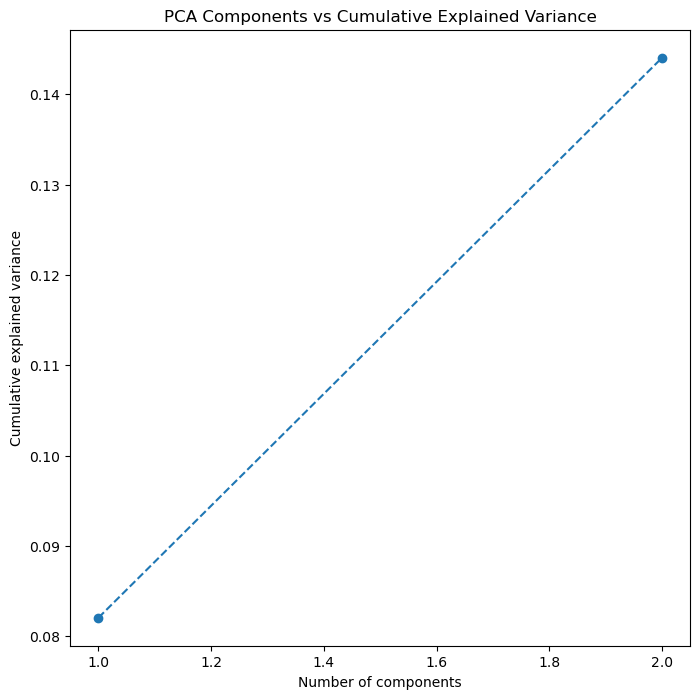

In [291]:
# Plotting the explained variance ratio
plt.figure(figsize = (8, 8))
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), np.cumsum(pca.explained_variance_ratio_), marker = 'o', linestyle = '--')
plt.title('PCA Components vs Cumulative Explained Variance')
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')
plt.show()

In [292]:
# Modeling

In [293]:
# Splitting the data into train and test
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 0)

In [294]:
x_train.shape

(1184, 2)

In [295]:
y_train.shape

(1184,)

In [296]:
x_test.shape

(296, 2)

In [297]:
y_test.shape

(296,)

In [299]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

In [300]:
models = {'Logistic Regression': LogisticRegression(), 'Random Forest':RandomForestClassifier(), 'Decision Tree':DecisionTreeClassifier(), 'SVM':SVC(), 'KNN':KNeighborsClassifier(),'SVM': SVC()}

In [301]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

In [302]:
for name, model in models.items():
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    print(name, model.score(x_test, y_test))
    print('\n')
    accuracy = accuracy_score(y_test, y_pred)
    print(accuracy)
    print('\n')
    print(confusion_matrix(y_test, y_pred))
    print('\n')
    print(classification_report(y_test, y_pred))

Logistic Regression 0.5945945945945946


0.5945945945945946


[[88 52]
 [68 88]]


              precision    recall  f1-score   support

           0       0.56      0.63      0.59       140
           1       0.63      0.56      0.59       156

    accuracy                           0.59       296
   macro avg       0.60      0.60      0.59       296
weighted avg       0.60      0.59      0.59       296

Random Forest 0.5912162162162162


0.5912162162162162


[[86 54]
 [67 89]]


              precision    recall  f1-score   support

           0       0.56      0.61      0.59       140
           1       0.62      0.57      0.60       156

    accuracy                           0.59       296
   macro avg       0.59      0.59      0.59       296
weighted avg       0.59      0.59      0.59       296

Decision Tree 0.5844594594594594


0.5844594594594594


[[79 61]
 [62 94]]


              precision    recall  f1-score   support

           0       0.56      0.56      0.56       140


In [303]:
# Random forest is the best model performing with all metrics considered

In [304]:
# Cross validation
from sklearn.model_selection import cross_val_score
for name, model in models.items():
    score = cross_val_score(model, x, y, cv = 10, scoring = 'accuracy')
    print('Cross validation score of {} is {}'.format(name, score.mean()))

Cross validation score of Logistic Regression is 0.5939189189189189
Cross validation score of Random Forest is 0.6074324324324325
Cross validation score of Decision Tree is 0.5722972972972974
Cross validation score of SVM is 0.5817567567567568
Cross validation score of KNN is 0.6162162162162161


In [305]:
# After applying cross validarion score we can say that Random Forest is the best performing model

In [306]:
# Hyperparameter tuning

In [307]:
# Applying GridSearchCV

In [316]:
from sklearn.model_selection import GridSearchCV
param_grid = {'n_estimators':[50,100,200],
              'criterion': ['gini', 'entropy'],
              'max_depth': [10,20,30,None],
              'max_features': ['auto', 'sqrt', 'log2'],
              'min_samples_leaf': [1, 2, 4],
              'min_samples_split': [2, 5, 10],
              'bootstrap': [True, False],
              }

In [317]:
grid_search = GridSearchCV(estimator = RandomForestClassifier(random_state = 42), param_grid = param_grid, cv = 5, n_jobs = -1, scoring = 'f1', verbose = 2)

In [318]:
grid_search.fit(x_train, y_train)

Fitting 5 folds for each of 1296 candidates, totalling 6480 fits


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid={'bootstrap': [True, False],
                         'criterion': ['gini', 'entropy'],
                         'max_depth': [10, 20, 30, None],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [50, 100, 200]},
             scoring='f1', verbose=2)

In [319]:
best_parameters = grid_search.best_params_

In [320]:
best_model = grid_search.best_estimator_

In [321]:
print("Best Parameters: ",best_parameters)

Best Parameters:  {'bootstrap': True, 'criterion': 'entropy', 'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 50}


In [322]:
y_pred = best_model.predict(x_test)
print("Classification Report: \n",classification_report(y_test, y_pred))

Classification Report: 
               precision    recall  f1-score   support

           0       0.58      0.62      0.60       140
           1       0.64      0.60      0.62       156

    accuracy                           0.61       296
   macro avg       0.61      0.61      0.61       296
weighted avg       0.61      0.61      0.61       296



In [323]:
print("Confusion Matrix: \n",confusion_matrix(y_test, y_pred))

Confusion Matrix: 
 [[87 53]
 [63 93]]


In [324]:
print("Accuracy: ",accuracy_score(y_test, y_pred))

Accuracy:  0.6081081081081081


In [325]:
# Our Model is predicting well with an accuracy of 61%

In [329]:
# Predicting the final result
final_pred = best_model.predict(x_test)
final_pred

array([0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1,
       1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0,
       0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0,
       1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1,
       1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1,
       1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1,
       1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1,
       1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1,
       0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1,
       1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1,
       0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1,
       0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0,
       1, 1, 1, 1, 1, 0, 0, 1, 1, 1], dtype=int64)

In [331]:
comparison_df = pd.DataFrame({'Actual': y_test, 'Predicted': final_pred})
print(comparison_df)

      Actual  Predicted
567        0          0
1041       1          0
649        0          0
666        0          0
568        0          0
...      ...        ...
762        0          0
1090       1          0
1469       1          1
665        0          1
1055       1          1

[296 rows x 2 columns]


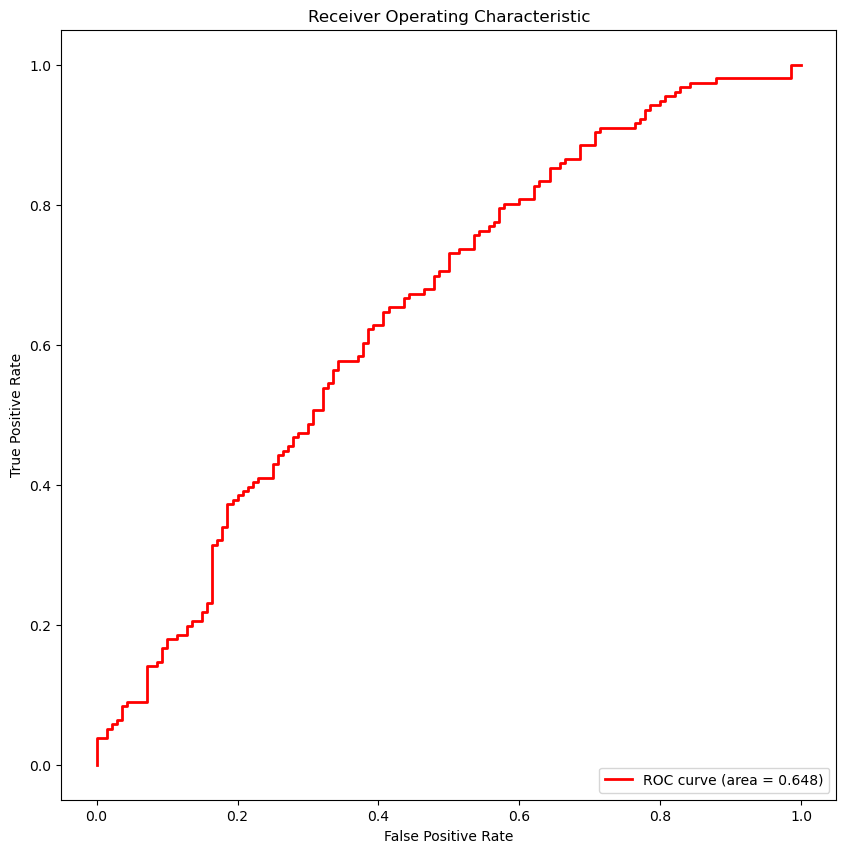

AUC Score:0.65


In [327]:
# Plotting the ROC curve
from sklearn.metrics import roc_curve, auc
# Predict probabilities on test set
y_pred_proba = best_model.predict_proba(x_test)[:, 1]
# Calculate ROC curve and AUCscore
fpr,tpr,thresholds = roc_curve(y_test, y_pred_proba)
roc_auc = auc(fpr, tpr)
# Plot ROC curve
plt.figure(figsize = (10, 10))
plt.plot(fpr, tpr, color = 'red', lw = 2, label = 'ROC curve (area = %0.3f)' % roc_auc)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc = 'lower right')
plt.show()

# Print the AUC score
print(f"AUC Score:{roc_auc:.2f}")

In [332]:
# It's time for saving the model
import pickle
pickle.dump(best_model, open('insurance.pkl', 'wb'))